# Part 0. Setup Environment and Load Packages

In [175]:
 %%time 

!apt install gdal-bin python-gdal python3-gdal 
!apt install python3-rtree 
!pip install git+git://github.com/geopandas/geopandas.git
!pip install descartes 

!pip install geopandas
!pip install osmnx
!pip install contextily
!pip install folium
!pip install plotly_express
!pip install geofeather

!pip install matplotlib==3.1.3

Reading package lists... Done
Building dependency tree       
Reading state information... Done
gdal-bin is already the newest version (2.2.3+dfsg-2).
python-gdal is already the newest version (2.2.3+dfsg-2).
python3-gdal is already the newest version (2.2.3+dfsg-2).
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'apt autoremove' to remove it.
0 upgraded, 0 newly installed, 0 to remove and 20 not upgraded.
Reading package lists... Done
Building dependency tree       
Reading state information... Done
python3-rtree is already the newest version (0.8.3+ds-1).
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'apt autoremove' to remove it.
0 upgraded, 0 newly installed, 0 to remove and 20 not upgraded.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning git://github.com/geopandas/geopandas.git to /tmp/pip-req-build-t4dxt0tb

CPU times: user 929 ms, sys: 398 ms, total: 1.33 s
Wall time: 2min 47s


In [176]:
import os
import pandas as pd
import numpy as np

from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn import model_selection
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from scipy.stats import uniform
from sklearn.preprocessing import StandardScaler 
from sklearn.inspection import permutation_importance
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

from xgboost import XGBRegressor 
from pprint import pprint

import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

import geopandas as gpd
import osmnx as ox
import folium
from folium.plugins import HeatMap
import geopy
from geopy.geocoders import Nominatim
from geopy.extra.rate_limiter import RateLimiter
import contextily as ctx
import geofeather
from geopandas import GeoDataFrame
from shapely.geometry import Point
from shapely import wkt
from shapely.geometry import Point, MultiPoint
from shapely.ops import nearest_points
from shapely import wkt

from tqdm import tqdm, tqdm_notebook

In [177]:
!pip install -U -q PyDrive

from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

# Part 1. Load Data

In [178]:
# https://drive.google.com/file/d/1xvN57SRB2HzKcyLn4InzhvUwDe-AMwbM/view?usp=sharing

id = "1xvN57SRB2HzKcyLn4InzhvUwDe-AMwbM"
file = drive.CreateFile({'id': id}) 
file.GetContentFile('Home_n_Map.csv')

In [179]:
env_data = pd.read_csv('Home_n_Map.csv')
env_data.head()

,NO value,NO2 value,PM2p5 value,geometry,road_type,zone,tract_name,GEOID,state,county,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
0,23.390071,17.539762,17.612700,POINT (-122.3225938 37.80678062),tertiary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322594,37.806781,high,0.7 - 0.8
1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80614989),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322310,37.806150,high,0.7 - 0.8
2,23.611111,23.967768,16.210698,POINT (-122.3223008 37.80642014),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322301,37.806420,high,0.7 - 0.8
3,15.714285,18.435184,15.561862,POINT (-122.3222988 37.80587979999999),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322299,37.805880,high,0.7 - 0.8
4,27.108695,25.797037,17.120884,POINT (-122.3222671 37.80668898),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322267,37.806689,high,0.7 - 0.8


# Part 2. Data Exploration

**NO value:** NO value measured;
 
**NO2 value:** $NO_{2}$ value measured;  

**PM2p5 value:** PM2.5 value measured;   
 
**geometry:** location of each data point, Point(Latitude, Longitude);    
   
**road_type:** type of road ('tertiary', 'secondary',  'residential', 'unclassified', 'motorway', 'primary');   
 
**zone:** type of zone ('industrial', 'mixed', 'residential', 'commercial', 'open_space');       
   
**tract_name:** track area name in Alameda county;
  
**GEOID:** GEOID for county subdivision, assigned by the Census Bureau and other state and federal agencies.    
     
**state:** GEOID for the state;       
   
**county:** GEOID for the county;        
 
**pop_den:** the population density;  

**wind:** the wind speed;      

**temp:** the temperature;          

**Longitude:** the logitude of the location;      

**Latitude:** the latitude of the location;      

**Respiratory_HI:** the respiratory health index; 

**Pt_CANCR:** the probability of getting cancer (national percentile, in normalization value);       


## 2.1 Check Raw Dataset

In [180]:
# Check data size
# 1826 rows, 17 columns
env_data.shape

(18286, 17)

In [181]:
# Check data information
env_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18286 entries, 0 to 18285
Data columns (total 17 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   NO value        18286 non-null  float64
 1   NO2 value       18286 non-null  float64
 2   PM2p5 value     18286 non-null  float64
 3   geometry        18286 non-null  object 
 4   road_type       18286 non-null  object 
 5   zone            18238 non-null  object 
 6   tract_name      18286 non-null  object 
 7   GEOID           18286 non-null  int64  
 8   state           18286 non-null  int64  
 9   county          18286 non-null  int64  
 10  pop_den         18286 non-null  float64
 11  wind            18270 non-null  float64
 12  temp            18270 non-null  float64
 13  Longitude       18286 non-null  float64
 14  Latitude        18286 non-null  float64
 15  Respiratory_HI  18286 non-null  object 
 16  Pt_CANCR        18286 non-null  object 
dtypes: float64(8), int64(3), object

In [182]:
# Print unique value in each column
for col in env_data:
  print(env_data[col].unique())

[23.39007073 19.70000009 23.61111146 ...  9.73333364  9.59183652
 18.84210492]
[17.53976153 19.9567502  23.96776835 ... 15.56677178  9.03994726
 16.12207242]
[17.61270038 15.94671902 16.21069794 ...  9.92203854 11.32562375
  9.27016621]
['POINT (-122.3225938 37.80678062)' 'POINT (-122.32231 37.80614989)'
 'POINT (-122.3223008 37.80642014)' ... 'POINT (-122.178876 37.78403392)'
 'POINT (-122.15509 37.77013811)' 'POINT (-122.1390328 37.73246375)']
['tertiary' 'secondary' 'residential' 'unclassified' 'motorway' 'primary']
['industrial' 'mixed' 'residential' 'commercial' nan 'open_space']
['Census Tract 9819, Alameda County, California'
 'Census Tract 4017, Alameda County, California'
 'Census Tract 4022, Alameda County, California'
 'Census Tract 4018, Alameda County, California'
 'Census Tract 9820, Alameda County, California'
 'Census Tract 4105, Alameda County, California'
 'Census Tract 4016, Alameda County, California'
 'Census Tract 4025, Alameda County, California'
 'Census Tract 4

In [183]:
# Missing Data
env_data.isnull().sum()

NO value           0
NO2 value          0
PM2p5 value        0
geometry           0
road_type          0
zone              48
tract_name         0
GEOID              0
state              0
county             0
pop_den            0
wind              16
temp              16
Longitude          0
Latitude           0
Respiratory_HI     0
Pt_CANCR           0
dtype: int64

## 2.2 Check Duplicates

In [184]:
# Duplicates
env_data[env_data.duplicated()]
# 3 duplicate rows

,NO value,NO2 value,PM2p5 value,geometry,road_type,zone,tract_name,GEOID,state,county,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
184,32.059862,24.190178,19.514652,POINT (-122.308528 37.81502824),secondary,industrial,"Census Tract 4017, Alameda County, California",6001401700,6,1,220.026011,4.125000,15.000001,-122.308528,37.815028,high,0.7 - 0.8
514,16.426667,19.134740,18.727645,POINT (-122.3001287 37.80641093),secondary,mixed,"Census Tract 4022, Alameda County, California",6001402200,6,1,3520.358174,4.083333,15.083335,-122.300129,37.806411,high,0.7 - 0.8
7197,92.638344,45.426999,28.987625,POINT (-122.233788 37.77509246),motorway,mixed,"Census Tract 4061, Alameda County, California",6001406100,6,1,2351.277070,4.091667,15.166668,-122.233788,37.775092,high,0.7 - 0.8


## 2.2 Check Outliers

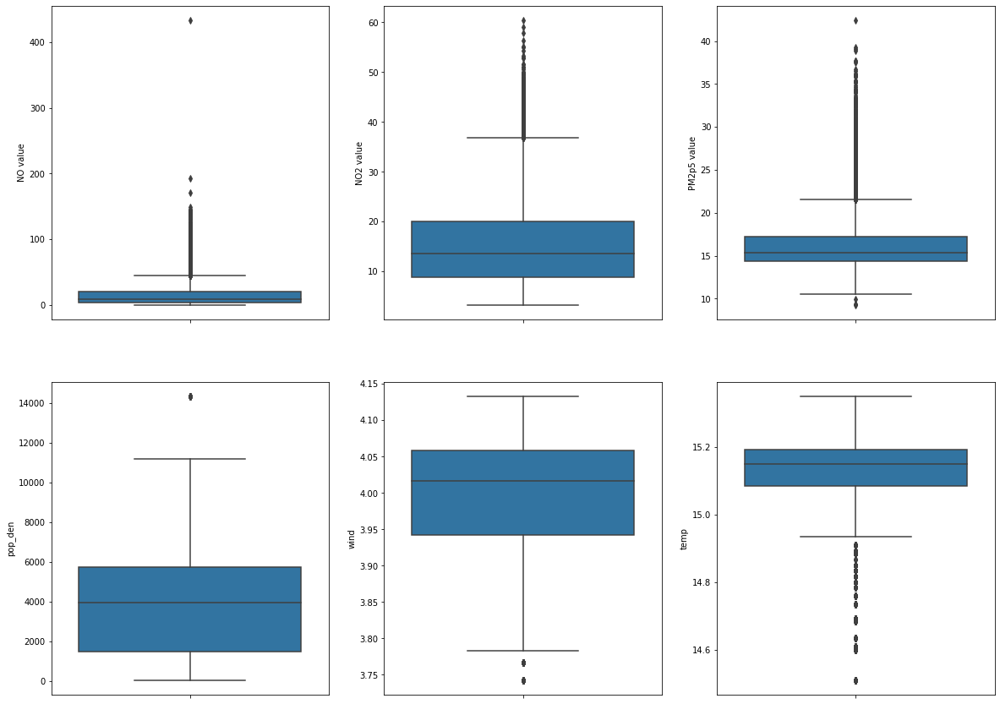

In [185]:
# Boxplots
# It seems that there are a significant outlier in NO. Most of the NO is less than 200, but one is greater than 400.
_, axss = plt.subplots(2, 3, figsize = [20,15]) 
sns.boxplot(y ='NO value', data = env_data, ax = axss[0, 0])
sns.boxplot(y ='NO2 value', data = env_data, ax = axss[0, 1])
sns.boxplot(y ='PM2p5 value', data = env_data, ax = axss[0, 2])
sns.boxplot(y ='pop_den', data = env_data, ax = axss[1][0])
sns.boxplot(y ='wind', data = env_data, ax = axss[1][1])
sns.boxplot(y ='temp', data = env_data, ax = axss[1][2])

## 2.3 Check the Map Visualization

In [186]:
env_view_map = env_data.copy()
# Convert pandas dataframe to geopandas dataframe for plotting
# Based on longitude and latitude
# 'epsg: 4326': convert degree
env_view_map = gpd.GeoDataFrame(env_view_map, 
                           geometry = gpd.points_from_xy(env_view_map.Longitude, env_view_map.Latitude), 
                           crs = {'init': 'epsg:4326'})

env_view_map.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 18286 entries, 0 to 18285
Data columns (total 17 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   NO value        18286 non-null  float64 
 1   NO2 value       18286 non-null  float64 
 2   PM2p5 value     18286 non-null  float64 
 3   geometry        18286 non-null  geometry
 4   road_type       18286 non-null  object  
 5   zone            18238 non-null  object  
 6   tract_name      18286 non-null  object  
 7   GEOID           18286 non-null  int64   
 8   state           18286 non-null  int64   
 9   county          18286 non-null  int64   
 10  pop_den         18286 non-null  float64 
 11  wind            18270 non-null  float64 
 12  temp            18270 non-null  float64 
 13  Longitude       18286 non-null  float64 
 14  Latitude        18286 non-null  float64 
 15  Respiratory_HI  18286 non-null  object  
 16  Pt_CANCR        18286 non-null  object  
dtypes: f

/usr/local/lib/python3.7/dist-packages/pyproj/crs/crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


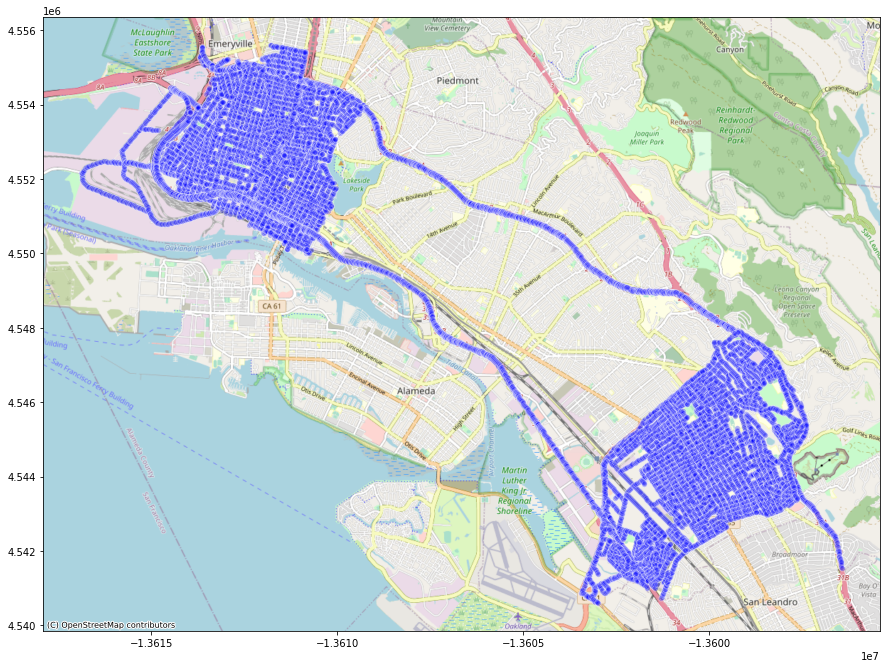

In [187]:
# Map Visualization
fig, ax = plt.subplots(figsize = (15, 12))
env_view_map.to_crs(epsg = 3857).plot(ax = ax, 
                                      figsize = (12, 12), 
                                      markersize = 30, 
                                      color = "blue", 
                                      edgecolor = "white", alpha = 0.3, marker = "o")

ctx.add_basemap(ax, source = ctx.providers.OpenStreetMap.Mapnik)

# Part 3. Data Preprocessing

## 3.1 Rename Features

In [188]:
env_data = env_data.rename(columns = {"NO value": "NO", "NO2 value": "NO2", "PM2p5 value": "PM2p5"})
env_data.head()

,NO,NO2,PM2p5,geometry,road_type,zone,tract_name,GEOID,state,county,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
0,23.390071,17.539762,17.612700,POINT (-122.3225938 37.80678062),tertiary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322594,37.806781,high,0.7 - 0.8
1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80614989),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322310,37.806150,high,0.7 - 0.8
2,23.611111,23.967768,16.210698,POINT (-122.3223008 37.80642014),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322301,37.806420,high,0.7 - 0.8
3,15.714285,18.435184,15.561862,POINT (-122.3222988 37.80587979999999),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322299,37.805880,high,0.7 - 0.8
4,27.108695,25.797037,17.120884,POINT (-122.3222671 37.80668898),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322267,37.806689,high,0.7 - 0.8


## 3.2 Drop Irrelevant Features

In [189]:
env_ft = env_data.drop(['state', 'county', 'tract_name', 'GEOID'], axis = 1)
env_ft.head()

,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
0,23.390071,17.539762,17.612700,POINT (-122.3225938 37.80678062),tertiary,industrial,8.336845,4.133333,14.950001,-122.322594,37.806781,high,0.7 - 0.8
1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80614989),secondary,industrial,8.336845,4.133333,14.950001,-122.322310,37.806150,high,0.7 - 0.8
2,23.611111,23.967768,16.210698,POINT (-122.3223008 37.80642014),secondary,industrial,8.336845,4.133333,14.950001,-122.322301,37.806420,high,0.7 - 0.8
3,15.714285,18.435184,15.561862,POINT (-122.3222988 37.80587979999999),secondary,industrial,8.336845,4.133333,14.950001,-122.322299,37.805880,high,0.7 - 0.8
4,27.108695,25.797037,17.120884,POINT (-122.3222671 37.80668898),secondary,industrial,8.336845,4.133333,14.950001,-122.322267,37.806689,high,0.7 - 0.8


## 3.3 Drop Missing Values

In [192]:
env_miss = env_ft.dropna(subset = ['zone', 'wind', 'temp'], axis = 0)
env_miss = env_miss.reset_index()
env_miss.isnull().sum()

index             0
NO                0
NO2               0
PM2p5             0
geometry          0
road_type         0
zone              0
pop_den           0
wind              0
temp              0
Longitude         0
Latitude          0
Respiratory_HI    0
Pt_CANCR          0
dtype: int64

In [193]:
env_miss = env_miss.drop(['index'], axis = 1)
env_miss.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18222 entries, 0 to 18221
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   NO              18222 non-null  float64
 1   NO2             18222 non-null  float64
 2   PM2p5           18222 non-null  float64
 3   geometry        18222 non-null  object 
 4   road_type       18222 non-null  object 
 5   zone            18222 non-null  object 
 6   pop_den         18222 non-null  float64
 7   wind            18222 non-null  float64
 8   temp            18222 non-null  float64
 9   Longitude       18222 non-null  float64
 10  Latitude        18222 non-null  float64
 11  Respiratory_HI  18222 non-null  object 
 12  Pt_CANCR        18222 non-null  object 
dtypes: float64(8), object(5)
memory usage: 1.8+ MB


## 3.4 Drop Duplicates

In [194]:
env_dp = env_miss.copy()
env_dp = env_miss.drop_duplicates()
env_dp.reset_index(inplace = True)

In [195]:
env_dp = env_dp.drop(['index'], axis = 1)
env_dp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18219 entries, 0 to 18218
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   NO              18219 non-null  float64
 1   NO2             18219 non-null  float64
 2   PM2p5           18219 non-null  float64
 3   geometry        18219 non-null  object 
 4   road_type       18219 non-null  object 
 5   zone            18219 non-null  object 
 6   pop_den         18219 non-null  float64
 7   wind            18219 non-null  float64
 8   temp            18219 non-null  float64
 9   Longitude       18219 non-null  float64
 10  Latitude        18219 non-null  float64
 11  Respiratory_HI  18219 non-null  object 
 12  Pt_CANCR        18219 non-null  object 
dtypes: float64(8), object(5)
memory usage: 1.8+ MB


In [196]:
env_dp[env_dp.duplicated()]

,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR


## 3.5 Check Outliers

In [197]:
env_out = env_dp.copy()
env_out.loc[env_out['NO'] > 200, 'NO'] = 200

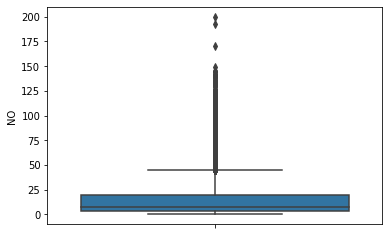

In [198]:
sns.boxplot(y ='NO', data = env_out)
plt.show()

In [199]:
env_out.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18219 entries, 0 to 18218
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   NO              18219 non-null  float64
 1   NO2             18219 non-null  float64
 2   PM2p5           18219 non-null  float64
 3   geometry        18219 non-null  object 
 4   road_type       18219 non-null  object 
 5   zone            18219 non-null  object 
 6   pop_den         18219 non-null  float64
 7   wind            18219 non-null  float64
 8   temp            18219 non-null  float64
 9   Longitude       18219 non-null  float64
 10  Latitude        18219 non-null  float64
 11  Respiratory_HI  18219 non-null  object 
 12  Pt_CANCR        18219 non-null  object 
dtypes: float64(8), object(5)
memory usage: 1.8+ MB


In [200]:
env_out.head()

,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
0,23.390071,17.539762,17.612700,POINT (-122.3225938 37.80678062),tertiary,industrial,8.336845,4.133333,14.950001,-122.322594,37.806781,high,0.7 - 0.8
1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80614989),secondary,industrial,8.336845,4.133333,14.950001,-122.322310,37.806150,high,0.7 - 0.8
2,23.611111,23.967768,16.210698,POINT (-122.3223008 37.80642014),secondary,industrial,8.336845,4.133333,14.950001,-122.322301,37.806420,high,0.7 - 0.8
3,15.714285,18.435184,15.561862,POINT (-122.3222988 37.80587979999999),secondary,industrial,8.336845,4.133333,14.950001,-122.322299,37.805880,high,0.7 - 0.8
4,27.108695,25.797037,17.120884,POINT (-122.3222671 37.80668898),secondary,industrial,8.336845,4.133333,14.950001,-122.322267,37.806689,high,0.7 - 0.8


# Part 4. Feature Engineering

## 4.1 Import Oakland Street and Map Data

In [201]:
oakland_gpd = ox.geocode_to_gdf('Oakland, California')
oakland_gpd

,geometry,bbox_north,bbox_south,bbox_east,bbox_west,place_id,osm_type,osm_id,lat,lon,display_name,class,type,importance
0,"POLYGON ((-122.35588 37.83573, -122.35009 37.8...",37.885426,37.633676,-122.11442,-122.355881,298690193,relation,2833530,37.804456,-122.271356,"Oakland, Alameda County, California, United St...",boundary,administrative,0.851796


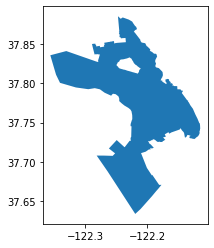

In [202]:
oakland_gpd.plot()

## 4.2 Convert to GeoDatafFrame

In [203]:
# .crs = .info
oakland_gpd.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [204]:
# Convert pandas dataframe to geopandas dataframe for plotting
# Based on longitude and latitude
# 'epsg:4326': convert degree
env_gpd = gpd.GeoDataFrame(env_out, 
                           geometry = gpd.points_from_xy(env_out.Longitude, env_out.Latitude), 
                           crs = {'init': 'epsg:4326'})

env_gpd.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 18219 entries, 0 to 18218
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   NO              18219 non-null  float64 
 1   NO2             18219 non-null  float64 
 2   PM2p5           18219 non-null  float64 
 3   geometry        18219 non-null  geometry
 4   road_type       18219 non-null  object  
 5   zone            18219 non-null  object  
 6   pop_den         18219 non-null  float64 
 7   wind            18219 non-null  float64 
 8   temp            18219 non-null  float64 
 9   Longitude       18219 non-null  float64 
 10  Latitude        18219 non-null  float64 
 11  Respiratory_HI  18219 non-null  object  
 12  Pt_CANCR        18219 non-null  object  
dtypes: float64(8), geometry(1), object(4)
memory usage: 1.8+ MB


/usr/local/lib/python3.7/dist-packages/pyproj/crs/crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


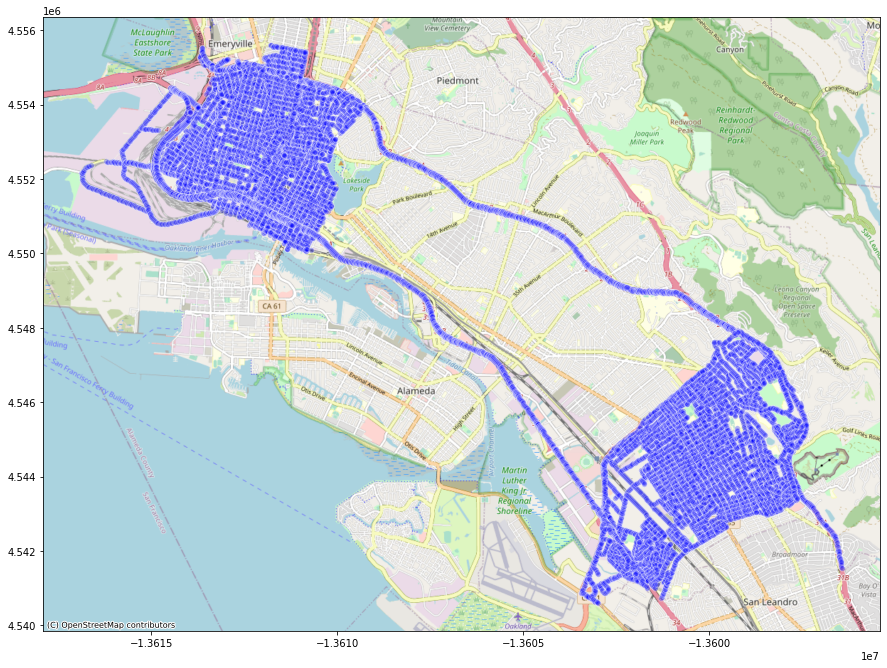

In [205]:
# Map Visualization
fig, ax = plt.subplots(figsize = (15, 12))
env_gpd.to_crs(epsg = 3857).plot(ax = ax, figsize = (12, 12), markersize = 30, color = "blue", edgecolor = "white", alpha = 0.3, marker = "o")

ctx.add_basemap(ax, source = ctx.providers.OpenStreetMap.Mapnik)

In [206]:
env_gpd.crs

<Geographic 2D CRS: +init=epsg:4326 +type=crs>
Name: WGS 84
Axis Info [ellipsoidal]:
- lon[east]: Longitude (degree)
- lat[north]: Latitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

## 4.3 Spatial Inner Join Two GeoDataFrame

In [207]:
oakland_city = gpd.sjoin(env_gpd, oakland_gpd, how = "inner", op = "intersects")
oakland_city.head()

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:3249: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if (await self.run_code(code, result,  async_=asy)):
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: +init=epsg:4326 +type=crs
Right CRS: EPSG:4326

  """Entry point for launching an IPython kernel.


,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,Longitude,...,bbox_west,place_id,osm_type,osm_id,lat,lon,display_name,class,type,importance
0,23.390071,17.539762,17.612700,POINT (-122.32259 37.80678),tertiary,industrial,8.336845,4.133333,14.950001,-122.322594,...,-122.355881,298690193,relation,2833530,37.804456,-122.271356,"Oakland, Alameda County, California, United St...",boundary,administrative,0.851796
1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80615),secondary,industrial,8.336845,4.133333,14.950001,-122.322310,...,-122.355881,298690193,relation,2833530,37.804456,-122.271356,"Oakland, Alameda County, California, United St...",boundary,administrative,0.851796
2,23.611111,23.967768,16.210698,POINT (-122.32230 37.80642),secondary,industrial,8.336845,4.133333,14.950001,-122.322301,...,-122.355881,298690193,relation,2833530,37.804456,-122.271356,"Oakland, Alameda County, California, United St...",boundary,administrative,0.851796
3,15.714285,18.435184,15.561862,POINT (-122.32230 37.80588),secondary,industrial,8.336845,4.133333,14.950001,-122.322299,...,-122.355881,298690193,relation,2833530,37.804456,-122.271356,"Oakland, Alameda County, California, United St...",boundary,administrative,0.851796
4,27.108695,25.797037,17.120884,POINT (-122.32227 37.80669),secondary,industrial,8.336845,4.133333,14.950001,-122.322267,...,-122.355881,298690193,relation,2833530,37.804456,-122.271356,"Oakland, Alameda County, California, United St...",boundary,administrative,0.851796


In [208]:
oakland_city.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 18219 entries, 0 to 18218
Data columns (total 27 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   NO              18219 non-null  float64 
 1   NO2             18219 non-null  float64 
 2   PM2p5           18219 non-null  float64 
 3   geometry        18219 non-null  geometry
 4   road_type       18219 non-null  object  
 5   zone            18219 non-null  object  
 6   pop_den         18219 non-null  float64 
 7   wind            18219 non-null  float64 
 8   temp            18219 non-null  float64 
 9   Longitude       18219 non-null  float64 
 10  Latitude        18219 non-null  float64 
 11  Respiratory_HI  18219 non-null  object  
 12  Pt_CANCR        18219 non-null  object  
 13  index_right     18219 non-null  int64   
 14  bbox_north      18219 non-null  float64 
 15  bbox_south      18219 non-null  float64 
 16  bbox_east       18219 non-null  float64 
 17  bbox

In [209]:
oakland_city.nunique()

NO                15963
NO2               18162
PM2p5             18217
geometry          18217
road_type             6
zone                  5
pop_den              70
wind                 45
temp                 80
Longitude         18067
Latitude          18194
Respiratory_HI        3
Pt_CANCR              3
index_right           1
bbox_north            1
bbox_south            1
bbox_east             1
bbox_west             1
place_id              1
osm_type              1
osm_id                1
lat                   1
lon                   1
display_name          1
class                 1
type                  1
importance            1
dtype: int64

In [210]:
# Remove irrelavant features
oakland_city = oakland_city.drop(['index_right', 'bbox_north', 'bbox_south', 'bbox_east', 'bbox_west'], axis = 1)

## 4.4 Get the City Structure Data

In [211]:
oakland_street = ox.graph_from_place('Oakland, California', network_type = 'drive')
nodes, edges = ox.graph_to_gdfs(oakland_street)

In [212]:
nodes.head()

,y,x,ref,highway,street_count,geometry
osmid,,,,,,
30362888,37.825844,-122.303049,8A,motorway_junction,3,POINT (-122.30305 37.82584)
30363957,37.825477,-122.307034,NaN,NaN,3,POINT (-122.30703 37.82548)
30364093,37.825462,-122.307568,NaN,NaN,3,POINT (-122.30757 37.82546)
30364111,37.823569,-122.302980,NaN,NaN,3,POINT (-122.30298 37.82357)
30364114,37.822884,-122.301088,NaN,NaN,3,POINT (-122.30109 37.82288)


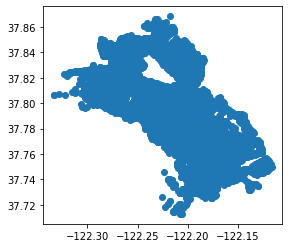

In [213]:
nodes.plot()

In [214]:
edges.head()

osmid  oneway lanes   ref  \
u        v          key                                              
30362888 1943438853 0                710721717    True     7  I 80   
         30363957   0                  4757566    True     1   NaN   
30363957 30364093   0     [11192289, 11192284]    True   NaN   NaN   
                    1               1023128418    True     1   NaN   
30364093 30364111   0    [859662715, 11300127]    True     2   NaN   

                               highway maxspeed   length  \
u        v          key                                    
30362888 1943438853 0         motorway   50 mph  135.576   
         30363957   0    motorway_link   50 mph  352.533   
30363957 30364093   0    motorway_link   50 mph   67.719   
                    1    motorway_link   50 mph   47.081   
30364093 30364111   0    motorway_link   50 mph  871.979   

                                                                  geometry  \
u        v          key                                                      
30362888 1943438853 0    LINESTRING (-122.30305 37.82584, -122.30455 37...   
         30363957   0    LINESTRING (-122.30305 37.82584, -122.30463 37...   
30363957 30364093   0    LINESTRING (-122.30703 37.82548, -122.30711 37...   
                    1    LINESTRING (-122.30703 37.82548, -122.30744 37...   
30364093 30364111   0    LINESTRING (-122.30757 37.82546, -122.30868 37...   

                        bridge name tunnel access junction  
u        v          key                                     
30362888 1943438853 0      NaN  NaN    NaN    NaN      NaN  
         30363957   0      NaN  NaN    NaN    NaN      NaN  
30363957 30364093   0      NaN  NaN    NaN    NaN      NaN  
                    1      NaN  NaN    NaN    NaN      NaN  
30364093 30364111   0      yes  NaN    NaN    NaN      NaN

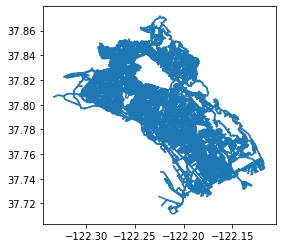

In [215]:
edges.plot() # edges is the roads in oakland

## 4.5 City Structure: Road

In [216]:
oakland_road = edges.copy()
oakland_road.shape
# There are 22,338 rows and 13 columns.

(22338, 13)

In [217]:
oakland_road.head()

osmid  oneway lanes   ref  \
u        v          key                                              
30362888 1943438853 0                710721717    True     7  I 80   
         30363957   0                  4757566    True     1   NaN   
30363957 30364093   0     [11192289, 11192284]    True   NaN   NaN   
                    1               1023128418    True     1   NaN   
30364093 30364111   0    [859662715, 11300127]    True     2   NaN   

                               highway maxspeed   length  \
u        v          key                                    
30362888 1943438853 0         motorway   50 mph  135.576   
         30363957   0    motorway_link   50 mph  352.533   
30363957 30364093   0    motorway_link   50 mph   67.719   
                    1    motorway_link   50 mph   47.081   
30364093 30364111   0    motorway_link   50 mph  871.979   

                                                                  geometry  \
u        v          key                                                      
30362888 1943438853 0    LINESTRING (-122.30305 37.82584, -122.30455 37...   
         30363957   0    LINESTRING (-122.30305 37.82584, -122.30463 37...   
30363957 30364093   0    LINESTRING (-122.30703 37.82548, -122.30711 37...   
                    1    LINESTRING (-122.30703 37.82548, -122.30744 37...   
30364093 30364111   0    LINESTRING (-122.30757 37.82546, -122.30868 37...   

                        bridge name tunnel access junction  
u        v          key                                     
30362888 1943438853 0      NaN  NaN    NaN    NaN      NaN  
         30363957   0      NaN  NaN    NaN    NaN      NaN  
30363957 30364093   0      NaN  NaN    NaN    NaN      NaN  
                    1      NaN  NaN    NaN    NaN      NaN  
30364093 30364111   0      yes  NaN    NaN    NaN      NaN

In [218]:
oakland_road[oakland_road.duplicated(subset = ['geometry'])]

,,,osmid,oneway,lanes,ref,highway,maxspeed,length,geometry,bridge,name,tunnel,access,junction
u,v,key,,,,,,,,,,,,,


In [219]:
print(oakland_road['highway'].value_counts())

residential                        14986
secondary                           2949
tertiary                            2524
primary                              773
motorway_link                        319
unclassified                         226
motorway                             204
secondary_link                       110
living_street                         78
trunk                                 58
tertiary_link                         43
trunk_link                            38
primary_link                          15
[unclassified, residential]            8
[secondary, residential]               3
[living_street, residential]           2
[motorway_link, secondary_link]        2
Name: highway, dtype: int64


### 4.5.1 Road Data Cleaning

Notice that there are possible duplicate column, such as 'tertiary' and 'tertiary_link'. We can remove the redundent '_link' and merge these two columns. And delete the ambiguous columns.

     'motorway_link' -> 'motorway'
     'secondary_link' -> 'secondary'
     'living_street' -> 'residential'
     'tertiary_link' -> 'tertiary'
     'trunk_link' -> 'trunk' -> 'secondary'
     'primary_link' -> 'primary'





In [220]:
oakland_road['highway'] = oakland_road['highway'].str.replace('_link', '')
oakland_road['highway'] = np.where(oakland_road['highway'] == 'trunk', 'secondary', oakland_road['highway'])
oakland_road['highway'] = np.where(oakland_road['highway'] == 'living_street', 'residential', oakland_road['highway'])

print(oakland_road['highway'].value_counts())

residential     15064
secondary        3155
tertiary         2567
primary           788
motorway          523
unclassified      226
Name: highway, dtype: int64


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


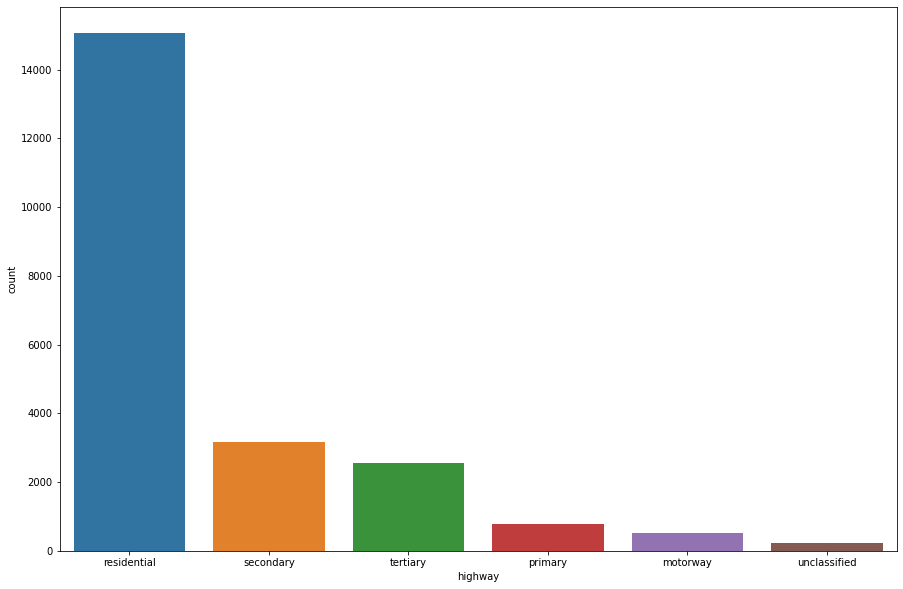

In [221]:
plt.figure(figsize = (15, 10))
sns.countplot(oakland_road['highway'], 
              order = oakland_road['highway'].value_counts().index)

In [222]:
oakland_road.shape

(22338, 13)

### 4.5.2 Map Visualization of Road

In [223]:
oakland_highways = oakland_road[oakland_road.highway == 'motorway']
oakland_primary = oakland_road[oakland_road.highway == 'primary']
oakland_secondary = oakland_road[oakland_road.highway == 'secondary']
oakland_tertiary = oakland_road[oakland_road.highway == 'tertiary']
oakland_residential = oakland_road[oakland_road.highway == 'residential']

In [224]:
# Check information
oakland_highways.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

#### 4.5.2.1 Highway Map Visualization

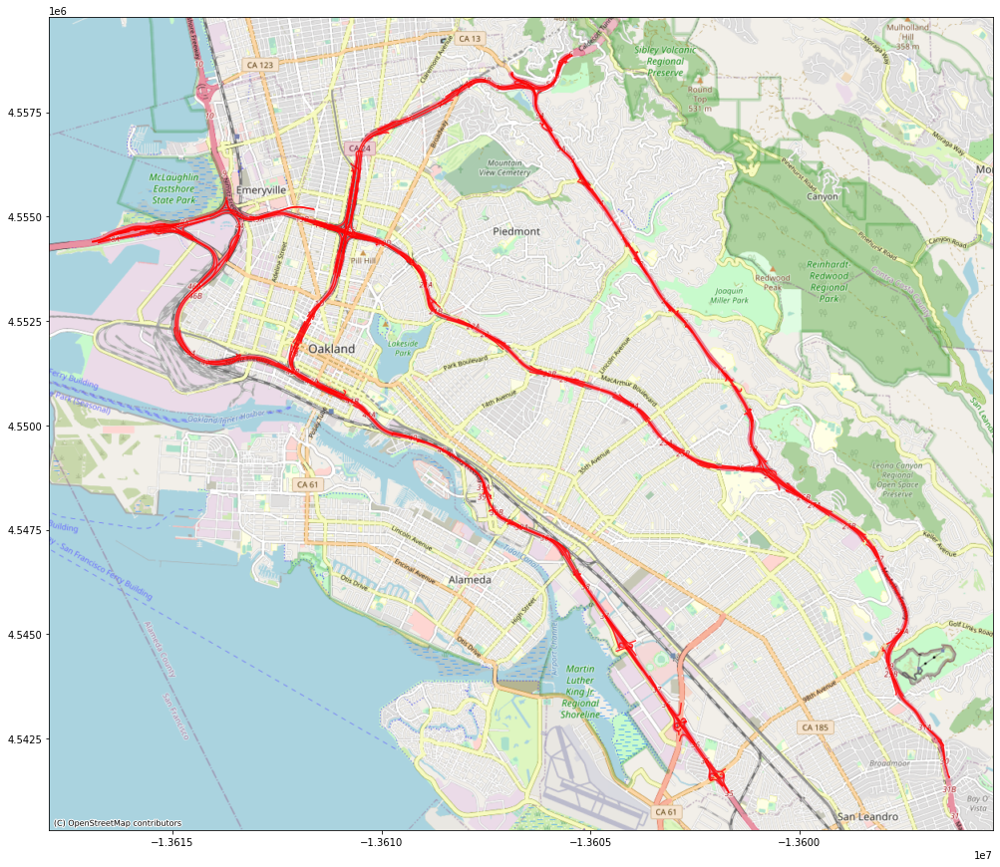

In [225]:
fig, ax = plt.subplots(figsize = (20, 15))
oakland_highways.to_crs(epsg = 3857).plot(ax = ax, 
                                          figsize = (12, 12), 
                                          markersize = 50, 
                                          color = "red", 
                                          edgecolor = "white", 
                                          alpha = 0.8, 
                                          marker = "o")
ctx.add_basemap(ax, source = ctx.providers.OpenStreetMap.Mapnik)

#### 4.5.2.2 Primary Road Map Visualization

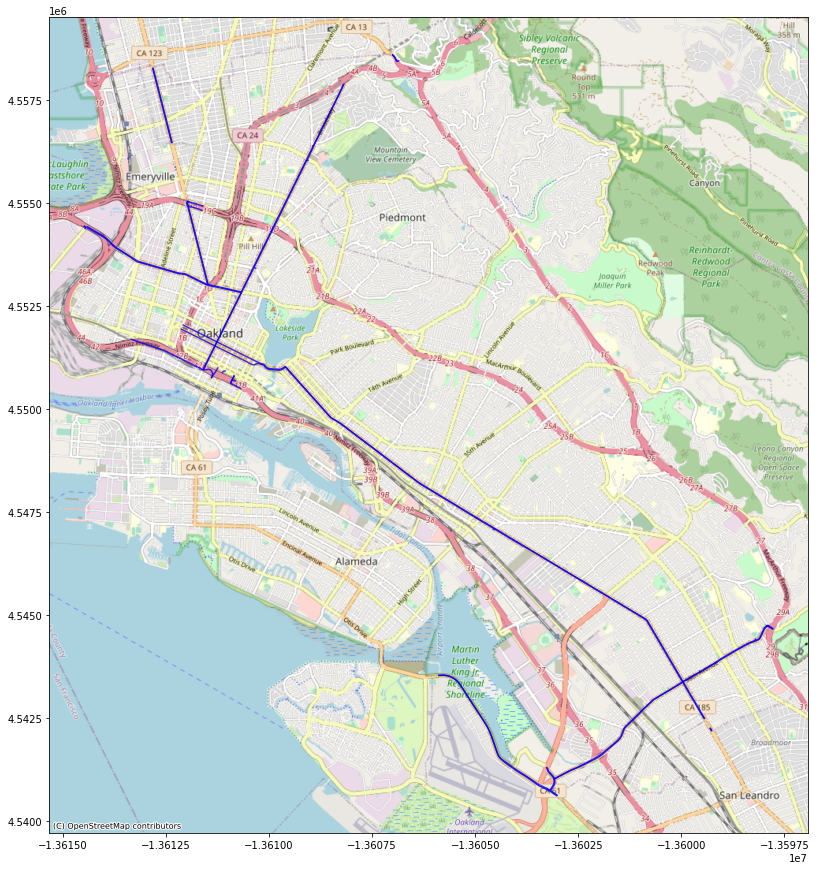

In [226]:
fig, ax = plt.subplots(figsize = (20, 15))
oakland_primary.to_crs(epsg = 3857).plot(ax = ax, 
                                         figsize = (12, 12), 
                                         markersize = 50, 
                                         color = "blue", 
                                         edgecolor = "white", 
                                         alpha = 0.8, 
                                         marker = "o")
ctx.add_basemap(ax, source = ctx.providers.OpenStreetMap.Mapnik)

#### 4.5.2.3 Secondary Road Map Visualization

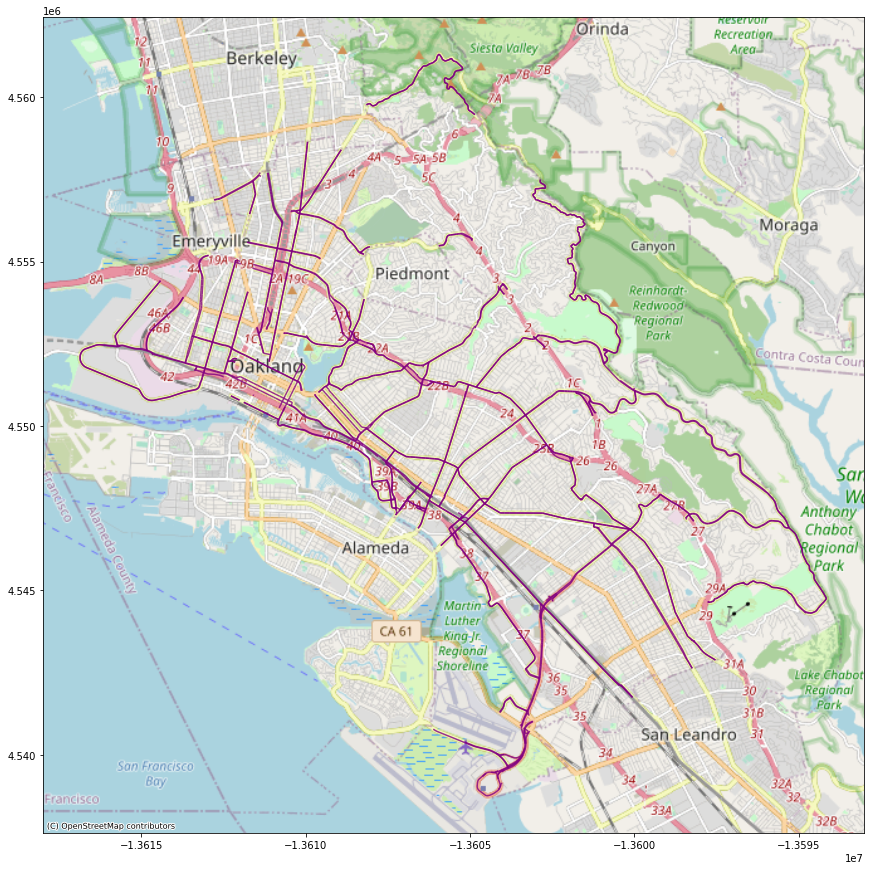

In [227]:
fig, ax = plt.subplots(figsize = (20, 15))
oakland_secondary.to_crs(epsg = 3857).plot(ax = ax, 
                                           figsize = (12, 12), 
                                           markersize = 50, 
                                           color = "purple", 
                                           edgecolor = "white", 
                                           alpha = 0.8, 
                                           marker = "o")
ctx.add_basemap(ax, source = ctx.providers.OpenStreetMap.Mapnik)

#### 4.5.2.4 Tertiary Road Map Visualization

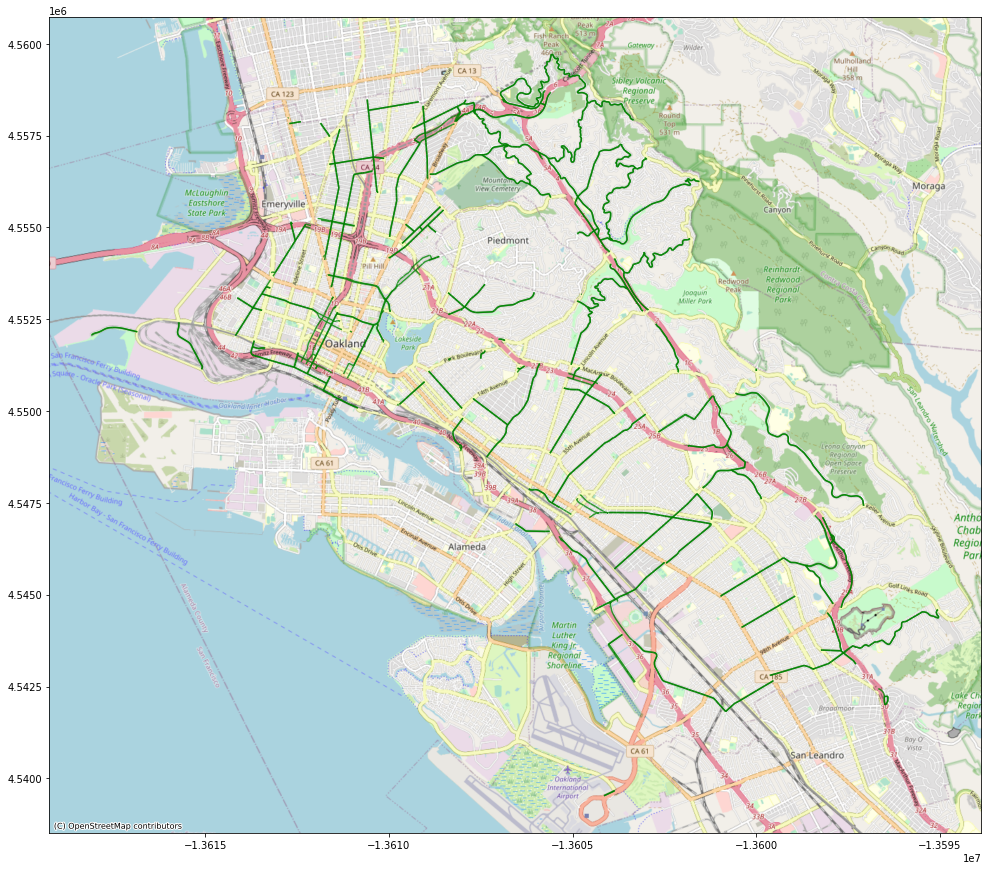

In [228]:
fig, ax = plt.subplots(figsize = (20, 15))
oakland_tertiary.to_crs(epsg = 3857).plot(ax = ax, 
                                          figsize = (12, 12), 
                                          markersize = 50, 
                                          color = "green", 
                                          edgecolor = "white", 
                                          alpha = 0.8, 
                                          marker = "o")
ctx.add_basemap(ax, source = ctx.providers.OpenStreetMap.Mapnik)

#### 4.5.2.5 Residential Road Map Visualization

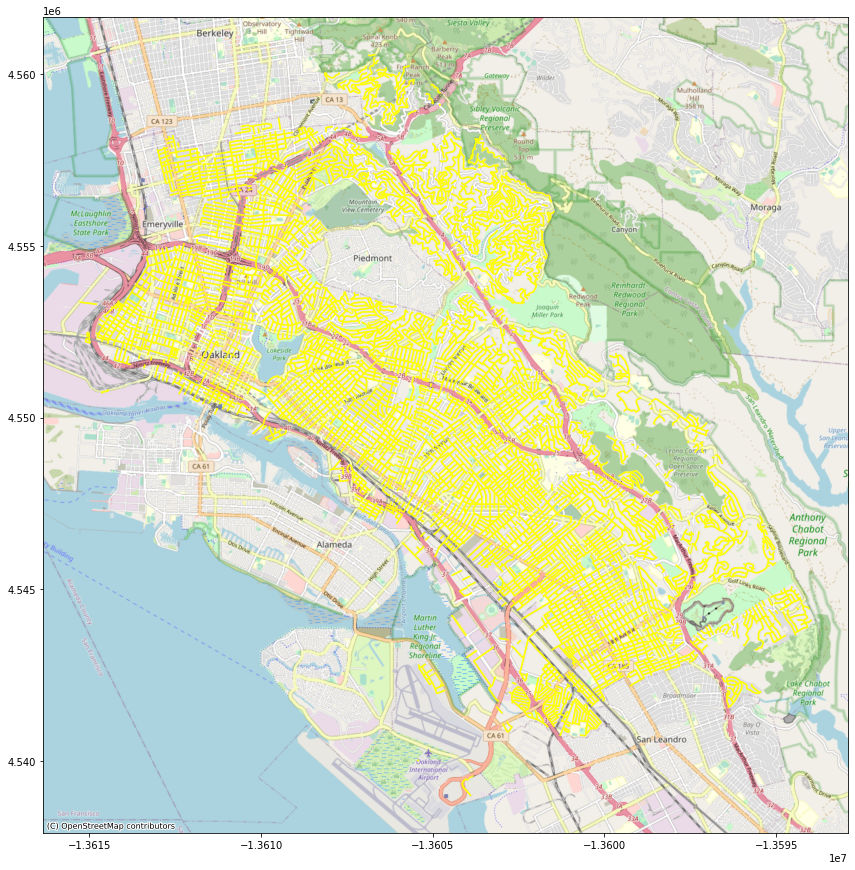

In [229]:
fig, ax = plt.subplots(figsize = (20, 15))
oakland_residential.to_crs(epsg = 3857).plot(ax = ax, 
                                             figsize = (12, 12), 
                                             markersize = 50, 
                                             color = "yellow", 
                                             edgecolor = "white", 
                                             alpha = 0.8, 
                                             marker = "o")
ctx.add_basemap(ax, source = ctx.providers.OpenStreetMap.Mapnik)

In [230]:
env_gpd.crs, oakland_road.crs

(<Geographic 2D CRS: +init=epsg:4326 +type=crs>
 Name: WGS 84
 Axis Info [ellipsoidal]:
 - lon[east]: Longitude (degree)
 - lat[north]: Latitude (degree)
 Area of Use:
 - name: World.
 - bounds: (-180.0, -90.0, 180.0, 90.0)
 Datum: World Geodetic System 1984 ensemble
 - Ellipsoid: WGS 84
 - Prime Meridian: Greenwich, <Geographic 2D CRS: EPSG:4326>
 Name: WGS 84
 Axis Info [ellipsoidal]:
 - Lat[north]: Geodetic latitude (degree)
 - Lon[east]: Geodetic longitude (degree)
 Area of Use:
 - name: World.
 - bounds: (-180.0, -90.0, 180.0, 90.0)
 Datum: World Geodetic System 1984 ensemble
 - Ellipsoid: WGS 84
 - Prime Meridian: Greenwich)

In [231]:
oakland_city.crs

<Geographic 2D CRS: +init=epsg:4326 +type=crs>
Name: WGS 84
Axis Info [ellipsoidal]:
- lon[east]: Longitude (degree)
- lat[north]: Latitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [232]:
oakland_city_utm = oakland_city.to_crs({'init': 'epsg:32610'}).copy()    
highway_utm = oakland_highways.to_crs({'init': 'epsg:32610'}).copy()
primary_utm = oakland_primary.to_crs({'init': 'epsg:32610'}).copy()
secondary_utm = oakland_secondary.to_crs({'init': 'epsg:32610'}).copy()
tertiary_utm = oakland_tertiary.to_crs({'init': 'epsg:32610'}).copy()

/usr/local/lib/python3.7/dist-packages/pyproj/crs/crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
/usr/local/lib/python3.7/dist-packages/pyproj/crs/crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
/usr/local/lib/python3.7/dist-packages/pyproj/crs/crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axi

In [233]:
def distance_to_roadway(gps, roadway):
    """
    Function calculates the distance from GPS point to nearest road lind polygon.
    """
    dis = []
    for i in roadway.geometry:
        dis.append(i.distance(gps))
    return(np.min(dis))

In [234]:
# Calculate distance to nearest highway
tqdm.pandas()
oakland_city['closest_highway'] = oakland_city_utm['geometry'].progress_apply(distance_to_roadway, roadway = highway_utm)

100%|██████████| 18219/18219 [01:08<00:00, 265.15it/s]


In [235]:
# Calculate distance to nearest primary road
tqdm.pandas()
oakland_city['closest_primary'] = oakland_city_utm['geometry'].progress_apply(distance_to_roadway, roadway = primary_utm)

100%|██████████| 18219/18219 [01:37<00:00, 186.50it/s]


In [236]:
# Calculate distance to nearest secondary road
tqdm.pandas()
oakland_city['closest_secondary'] = oakland_city_utm['geometry'].progress_apply(distance_to_roadway, roadway = secondary_utm)

100%|██████████| 18219/18219 [06:25<00:00, 47.32it/s]


In [237]:
# Calculate distance to nearest tertiary road
tqdm.pandas()
oakland_city['closest_tertiary'] = oakland_city_utm['geometry'].progress_apply(distance_to_roadway, roadway = tertiary_utm)

100%|██████████| 18219/18219 [05:13<00:00, 58.21it/s]


In [238]:
oakland_city.head()

,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,Longitude,...,lat,lon,display_name,class,type,importance,closest_highway,closest_primary,closest_secondary,closest_tertiary
0,23.390071,17.539762,17.612700,POINT (-122.32259 37.80678),tertiary,industrial,8.336845,4.133333,14.950001,-122.322594,...,37.804456,-122.271356,"Oakland, Alameda County, California, United St...",boundary,administrative,0.851796,1529.354679,2576.575272,3.000134e+01,0.003395
1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80615),secondary,industrial,8.336845,4.133333,14.950001,-122.322310,...,37.804456,-122.271356,"Oakland, Alameda County, California, United St...",boundary,administrative,0.851796,1510.616902,2605.774822,5.010205e-08,63.387249
2,23.611111,23.967768,16.210698,POINT (-122.32230 37.80642),secondary,industrial,8.336845,4.133333,14.950001,-122.322301,...,37.804456,-122.271356,"Oakland, Alameda County, California, United St...",boundary,administrative,0.851796,1506.806733,2584.619548,2.889834e-01,33.436991
3,15.714285,18.435184,15.561862,POINT (-122.32230 37.80588),secondary,industrial,8.336845,4.133333,14.950001,-122.322299,...,37.804456,-122.271356,"Oakland, Alameda County, California, United St...",boundary,administrative,0.851796,1513.209482,2625.798375,2.675342e-03,93.269052
4,27.108695,25.797037,17.120884,POINT (-122.32227 37.80669),secondary,industrial,8.336845,4.133333,14.950001,-122.322267,...,37.804456,-122.271356,"Oakland, Alameda County, California, United St...",boundary,administrative,0.851796,1501.369611,2562.159240,3.989883e-02,3.463454


## 4.6 Ciry Structure: Traffic Signal & Stop sign

In [239]:
nodes['highway'].value_counts()

traffic_signals      773
stop                 320
turning_circle       319
motorway_junction    131
crossing               9
mini_roundabout        4
trailhead              3
Name: highway, dtype: int64

In [240]:
nodes.head()

,y,x,ref,highway,street_count,geometry
osmid,,,,,,
30362888,37.825844,-122.303049,8A,motorway_junction,3,POINT (-122.30305 37.82584)
30363957,37.825477,-122.307034,NaN,NaN,3,POINT (-122.30703 37.82548)
30364093,37.825462,-122.307568,NaN,NaN,3,POINT (-122.30757 37.82546)
30364111,37.823569,-122.302980,NaN,NaN,3,POINT (-122.30298 37.82357)
30364114,37.822884,-122.301088,NaN,NaN,3,POINT (-122.30109 37.82288)


In [241]:
nodes.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

### 4.6.1 Map Visualization of Traffic Signals and Stop Sign

In [242]:
trafic_signals = nodes[nodes['highway'] == 'traffic_signals']
stop_cross = nodes[nodes['highway'] == 'stop']

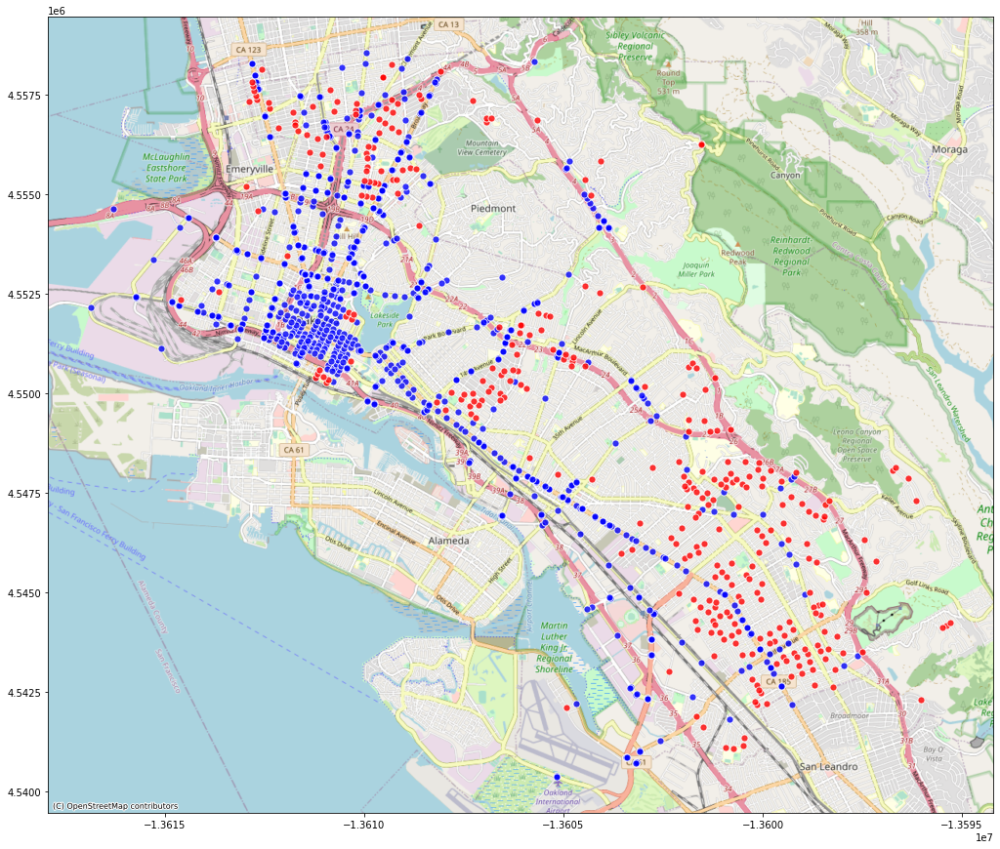

In [243]:
fig, ax = plt.subplots(figsize = (20, 15))

trafic_signals.to_crs(epsg = 3857).plot(ax = ax, 
                                        figsize = (12, 12), 
                                        markersize = 50, 
                                        color = "blue", 
                                        edgecolor = "white", 
                                        alpha = 0.8, 
                                        marker = "o")

stop_cross.to_crs(epsg = 3857).plot(ax = ax, 
                                    figsize = (12, 12), 
                                    markersize = 50, 
                                    color = "red", 
                                    edgecolor = "white", 
                                    alpha = 0.8, 
                                    marker = "o")

ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

### 4.6.2 Calcutate the Nearest Traffic Signal

In [244]:
# Convert geometry from degree to meter for further calculation
# utm: unit in meter
traffic_sig_utm = trafic_signals.to_crs({'init': 'epsg:32610'}).copy()
stop_sign_utm = stop_cross.to_crs({'init': 'epsg:32610'}).copy()      

/usr/local/lib/python3.7/dist-packages/pyproj/crs/crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
/usr/local/lib/python3.7/dist-packages/pyproj/crs/crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


In [245]:
def nearest_intersection(gps, intersections):
    """
    Function calculates the distance from GPS point to nearest intersection.
    """
    closest_point = nearest_points(gps, MultiPoint(intersections.values))[1]
    return(gps.distance(closest_point))

In [246]:
# Calculate the distance from the traffic signal to the nearest intersection
tqdm.pandas()
oakland_city['trafic_signal_dist'] = oakland_city_utm['geometry'].progress_apply(nearest_intersection, intersections = traffic_sig_utm['geometry'])

100%|██████████| 18219/18219 [01:30<00:00, 202.16it/s]


In [247]:
# Calculate the distance from the stop sign to the nearest intersection
tqdm.pandas()
oakland_city['stop_sign_dist'] = oakland_city_utm['geometry'].progress_apply(nearest_intersection, intersections = stop_sign_utm['geometry'])

100%|██████████| 18219/18219 [00:37<00:00, 484.75it/s]


# Part 5.  Data Preparation

## 5.1 Category Features

In [248]:
oakland_city.head()

,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,Longitude,...,display_name,class,type,importance,closest_highway,closest_primary,closest_secondary,closest_tertiary,trafic_signal_dist,stop_sign_dist
0,23.390071,17.539762,17.612700,POINT (-122.32259 37.80678),tertiary,industrial,8.336845,4.133333,14.950001,-122.322594,...,"Oakland, Alameda County, California, United St...",boundary,administrative,0.851796,1529.354679,2576.575272,3.000134e+01,0.003395,30.001344,1818.142667
1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80615),secondary,industrial,8.336845,4.133333,14.950001,-122.322310,...,"Oakland, Alameda County, California, United St...",boundary,administrative,0.851796,1510.616902,2605.774822,5.010205e-08,63.387249,63.387249,1800.106387
2,23.611111,23.967768,16.210698,POINT (-122.32230 37.80642),secondary,industrial,8.336845,4.133333,14.950001,-122.322301,...,"Oakland, Alameda County, California, United St...",boundary,administrative,0.851796,1506.806733,2584.619548,2.889834e-01,33.436991,33.436991,1796.026464
3,15.714285,18.435184,15.561862,POINT (-122.32230 37.80588),secondary,industrial,8.336845,4.133333,14.950001,-122.322299,...,"Oakland, Alameda County, California, United St...",boundary,administrative,0.851796,1513.209482,2625.798375,2.675342e-03,93.269052,93.269052,1802.893651
4,27.108695,25.797037,17.120884,POINT (-122.32227 37.80669),secondary,industrial,8.336845,4.133333,14.950001,-122.322267,...,"Oakland, Alameda County, California, United St...",boundary,administrative,0.851796,1501.369611,2562.159240,3.989883e-02,3.463454,3.463454,1790.303496


In [249]:
zone = oakland_city['zone']
road_type = oakland_city['road_type']

### 5.1.1 One-Hot encoding

In [250]:
oakland_city = pd.get_dummies(oakland_city, columns = ['road_type'], drop_first = False)      
oakland_city = pd.get_dummies(oakland_city, columns = ['zone'], drop_first = False)

oakland_city.head()

,NO,NO2,PM2p5,geometry,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,...,road_type_primary,road_type_residential,road_type_secondary,road_type_tertiary,road_type_unclassified,zone_commercial,zone_industrial,zone_mixed,zone_open_space,zone_residential
0,23.390071,17.539762,17.612700,POINT (-122.32259 37.80678),8.336845,4.133333,14.950001,-122.322594,37.806781,high,...,0,0,0,1,0,0,1,0,0,0
1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80615),8.336845,4.133333,14.950001,-122.322310,37.806150,high,...,0,0,1,0,0,0,1,0,0,0
2,23.611111,23.967768,16.210698,POINT (-122.32230 37.80642),8.336845,4.133333,14.950001,-122.322301,37.806420,high,...,0,0,1,0,0,0,1,0,0,0
3,15.714285,18.435184,15.561862,POINT (-122.32230 37.80588),8.336845,4.133333,14.950001,-122.322299,37.805880,high,...,0,0,1,0,0,0,1,0,0,0
4,27.108695,25.797037,17.120884,POINT (-122.32227 37.80669),8.336845,4.133333,14.950001,-122.322267,37.806689,high,...,0,0,1,0,0,0,1,0,0,0


In [251]:
# Merge two category features back
oakland_city = pd.concat([oakland_city, zone], axis = 1)
oakland_city = pd.concat([oakland_city, road_type], axis = 1)

In [252]:
oakland_city.head()

,NO,NO2,PM2p5,geometry,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,...,road_type_secondary,road_type_tertiary,road_type_unclassified,zone_commercial,zone_industrial,zone_mixed,zone_open_space,zone_residential,zone,road_type
0,23.390071,17.539762,17.612700,POINT (-122.32259 37.80678),8.336845,4.133333,14.950001,-122.322594,37.806781,high,...,0,1,0,0,1,0,0,0,industrial,tertiary
1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80615),8.336845,4.133333,14.950001,-122.322310,37.806150,high,...,1,0,0,0,1,0,0,0,industrial,secondary
2,23.611111,23.967768,16.210698,POINT (-122.32230 37.80642),8.336845,4.133333,14.950001,-122.322301,37.806420,high,...,1,0,0,0,1,0,0,0,industrial,secondary
3,15.714285,18.435184,15.561862,POINT (-122.32230 37.80588),8.336845,4.133333,14.950001,-122.322299,37.805880,high,...,1,0,0,0,1,0,0,0,industrial,secondary
4,27.108695,25.797037,17.120884,POINT (-122.32227 37.80669),8.336845,4.133333,14.950001,-122.322267,37.806689,high,...,1,0,0,0,1,0,0,0,industrial,secondary


In [253]:
oakland_city.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 18219 entries, 0 to 18218
Data columns (total 39 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   NO                      18219 non-null  float64 
 1   NO2                     18219 non-null  float64 
 2   PM2p5                   18219 non-null  float64 
 3   geometry                18219 non-null  geometry
 4   pop_den                 18219 non-null  float64 
 5   wind                    18219 non-null  float64 
 6   temp                    18219 non-null  float64 
 7   Longitude               18219 non-null  float64 
 8   Latitude                18219 non-null  float64 
 9   Respiratory_HI          18219 non-null  object  
 10  Pt_CANCR                18219 non-null  object  
 11  place_id                18219 non-null  int64   
 12  osm_type                18219 non-null  object  
 13  osm_id                  18219 non-null  int64   
 14  lat           

## 5.2 Drop Irrelevant Features

In [254]:
# drop irrelevant features
oakland_city = oakland_city.drop(['Pt_CANCR'], axis = 1)

## 5.3 Convert Categorical Features from String to Integer

**'Respiratory_HI':**

    'high' -> 3
    'moderate' -> 2
    'low' -> 1

In [255]:
oakland_city['Respiratory_HI'] = np.where(oakland_city['Respiratory_HI'].str.contains('high'), '3', oakland_city['Respiratory_HI'])
oakland_city['Respiratory_HI'] = np.where(oakland_city['Respiratory_HI'].str.contains('moderate'), '2', oakland_city['Respiratory_HI'])
oakland_city['Respiratory_HI'] = np.where(oakland_city['Respiratory_HI'].str.contains('low'), '1', oakland_city['Respiratory_HI'])

# Convert string object to float
oakland_city["Respiratory_HI"] = oakland_city.Respiratory_HI.astype(float)

oakland_city.head()

,NO,NO2,PM2p5,geometry,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,...,road_type_secondary,road_type_tertiary,road_type_unclassified,zone_commercial,zone_industrial,zone_mixed,zone_open_space,zone_residential,zone,road_type
0,23.390071,17.539762,17.612700,POINT (-122.32259 37.80678),8.336845,4.133333,14.950001,-122.322594,37.806781,3.0,...,0,1,0,0,1,0,0,0,industrial,tertiary
1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80615),8.336845,4.133333,14.950001,-122.322310,37.806150,3.0,...,1,0,0,0,1,0,0,0,industrial,secondary
2,23.611111,23.967768,16.210698,POINT (-122.32230 37.80642),8.336845,4.133333,14.950001,-122.322301,37.806420,3.0,...,1,0,0,0,1,0,0,0,industrial,secondary
3,15.714285,18.435184,15.561862,POINT (-122.32230 37.80588),8.336845,4.133333,14.950001,-122.322299,37.805880,3.0,...,1,0,0,0,1,0,0,0,industrial,secondary
4,27.108695,25.797037,17.120884,POINT (-122.32227 37.80669),8.336845,4.133333,14.950001,-122.322267,37.806689,3.0,...,1,0,0,0,1,0,0,0,industrial,secondary


In [256]:
oakland_city.Respiratory_HI.value_counts()

3.0    8885
2.0    5975
1.0    3359
Name: Respiratory_HI, dtype: int64

In [257]:
oakland_city.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 18219 entries, 0 to 18218
Data columns (total 38 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   NO                      18219 non-null  float64 
 1   NO2                     18219 non-null  float64 
 2   PM2p5                   18219 non-null  float64 
 3   geometry                18219 non-null  geometry
 4   pop_den                 18219 non-null  float64 
 5   wind                    18219 non-null  float64 
 6   temp                    18219 non-null  float64 
 7   Longitude               18219 non-null  float64 
 8   Latitude                18219 non-null  float64 
 9   Respiratory_HI          18219 non-null  float64 
 10  place_id                18219 non-null  int64   
 11  osm_type                18219 non-null  object  
 12  osm_id                  18219 non-null  int64   
 13  lat                     18219 non-null  float64 
 14  lon           

## 5.4 Obtain Numerical & Categorical Features

In [258]:
# Numerical Features
num_ft = ['NO', 'NO2', 'PM2p5', 'pop_den', 'wind', 'temp', 'closest_highway', 'closest_primary', 'closest_secondary', 'closest_tertiary', 
             'trafic_signal_dist', 'stop_sign_dist', 'road_type_motorway', 'road_type_primary', 'road_type_residential', 'road_type_secondary', 'road_type_tertiary', 
             'road_type_unclassified', 'zone_commercial', 'zone_industrial', 'zone_mixed', 'zone_open_space', 'zone_residential', 'Longitude', 'Latitude', 'Respiratory_HI']

# Categorical Features 
cat_ft = ['geometry', 'zone', 'road_type']

# Part 6. Data Visualization

In [259]:
oakland_vis = oakland_city.copy()

## 6.1 Correlation Matrix

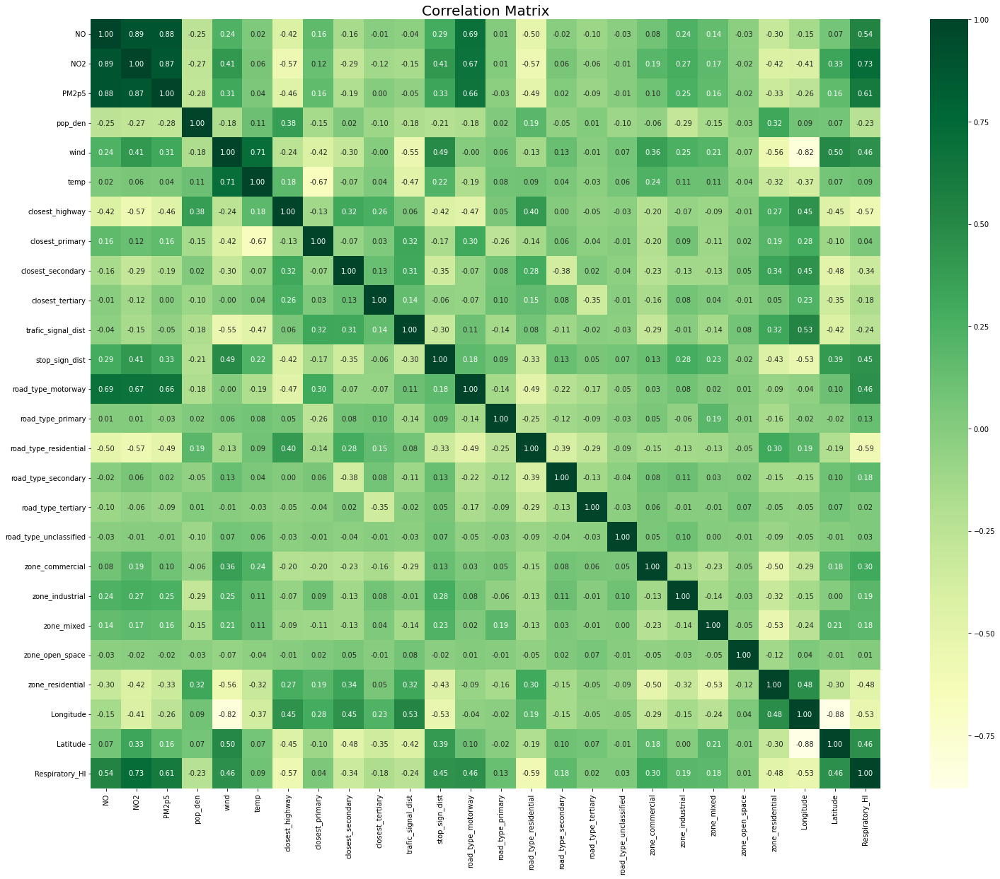

In [260]:
f, ax = plt.subplots(figsize = [25,20])
sns.heatmap(oakland_vis[num_ft].corr(), 
            annot = True, 
            fmt = ".2f", 
            ax = ax, 
            cmap = "YlGn" )
ax.set_title("Correlation Matrix", fontsize = 20)
plt.show()

In [261]:
env_corr = pd.DataFrame(oakland_vis[num_ft].corr()['Respiratory_HI'].sort_values(ascending = False))
env_corr = env_corr.iloc[1:, :]
env_corr.columns = ['Numerical Features Correlation']
env_corr

,Numerical Features Correlation
NO2,0.728085
PM2p5,0.613432
NO,0.535724
Latitude,0.462347
road_type_motorway,0.459021
wind,0.458197
stop_sign_dist,0.445701
zone_commercial,0.300468
zone_industrial,0.192171
zone_mixed,0.183228


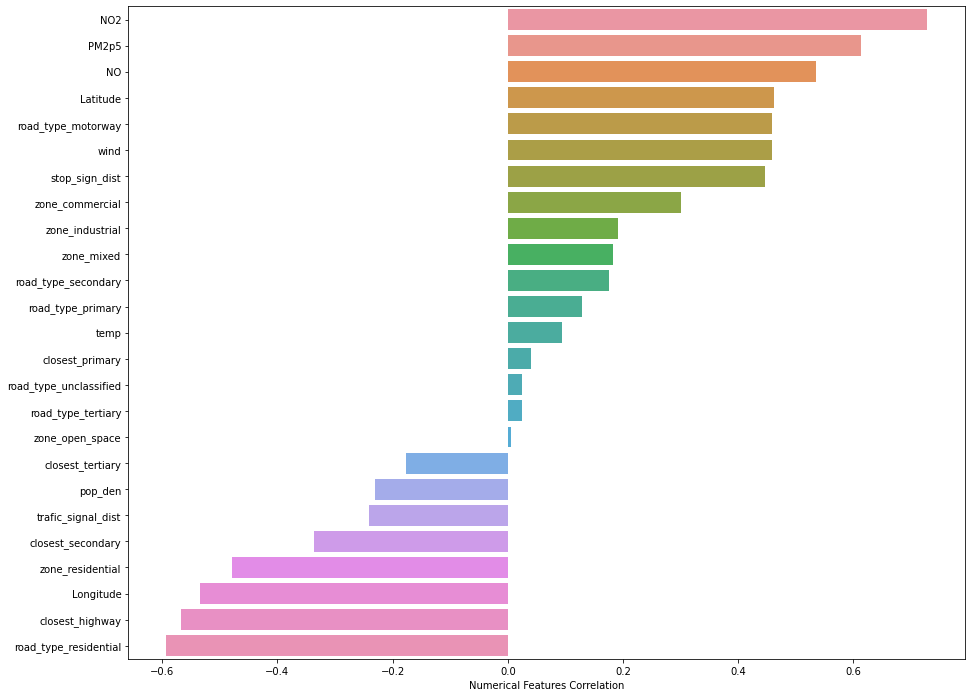

In [262]:
env_corr_rnk = sns.barplot(x = "Numerical Features Correlation", y = env_corr.index, data = env_corr)
env_corr_rnk.figure.set_size_inches(15, 12)

## 6.2 Map Visualization

### 6.2.1 NO (Heatmap)

Text(0, 0.5, 'Latitude')

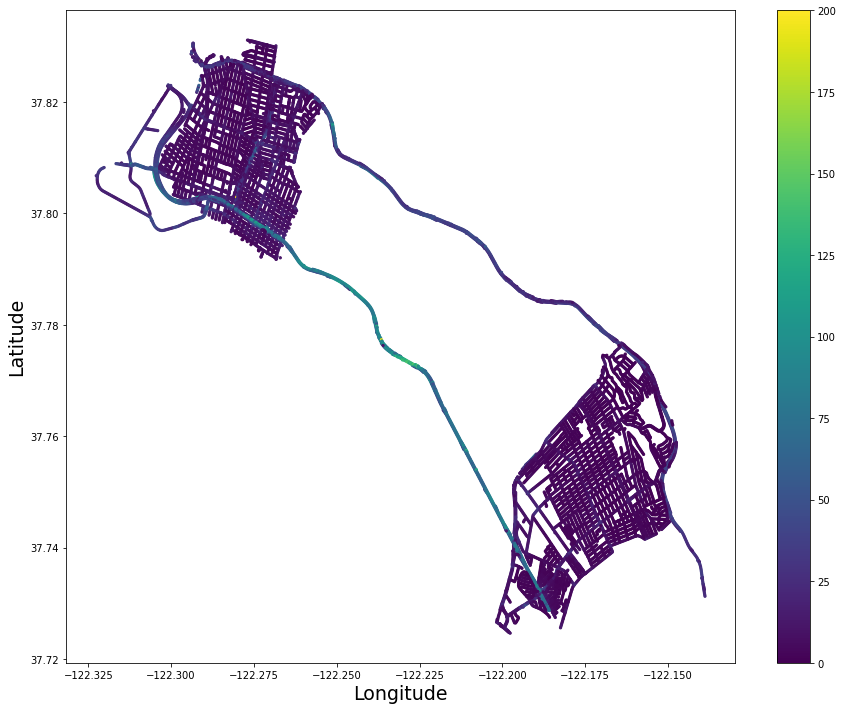

In [263]:
plt.figure(figsize = (15, 12))
plt.scatter(oakland_vis.Longitude, oakland_vis.Latitude, s = 5, c = oakland_vis.NO, cmap = 'viridis')
plt.colorbar() 
plt.xlabel('Longitude', fontsize = 19)
plt.ylabel('Latitude', fontsize = 19)

### 6.2.2 NO$_2$ (Heatmap)

Text(0, 0.5, 'Latitude')

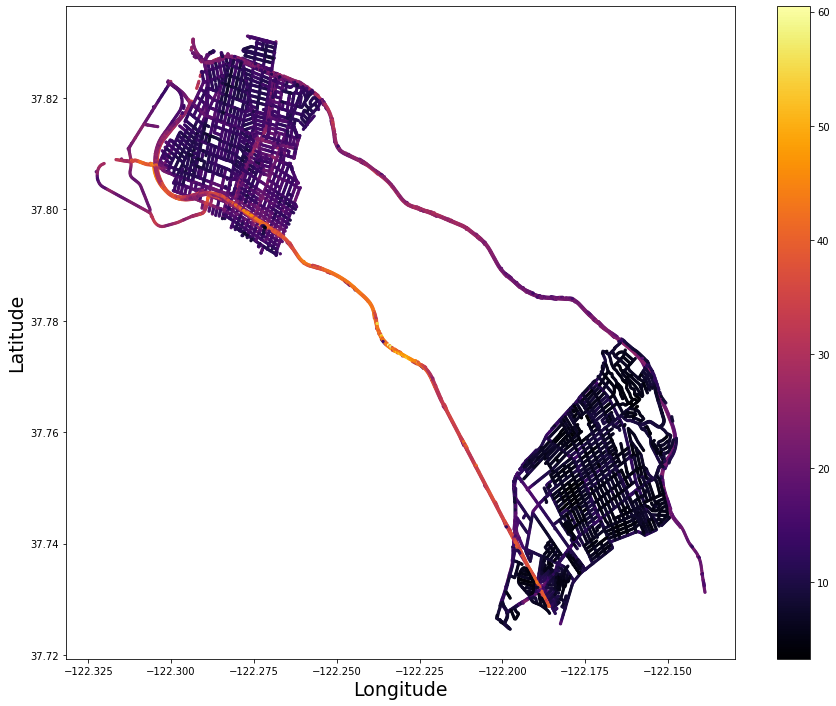

In [264]:
plt.figure(figsize = (15, 12))
plt.scatter(oakland_vis.Longitude, oakland_vis.Latitude, s = 5, c = oakland_vis.NO2, cmap = 'inferno')
plt.colorbar() 
plt.xlabel('Longitude', fontsize = 19)
plt.ylabel('Latitude', fontsize = 19)

### 6.2.3 PM 2.5 (Heatmap)

Text(0, 0.5, 'Latitude')

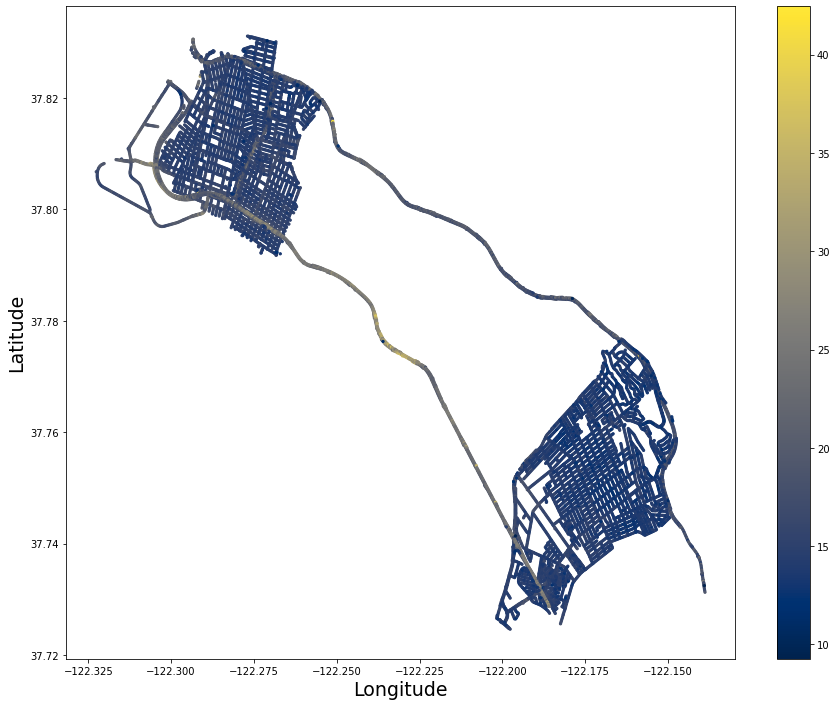

In [265]:
plt.figure(figsize = (15, 12))
plt.scatter(oakland_vis.Longitude, oakland_vis.Latitude, s = 5, c = oakland_vis.PM2p5, cmap = 'cividis')
plt.colorbar()
plt.xlabel('Longitude', fontsize = 19)
plt.ylabel('Latitude', fontsize = 19)

## 6.3 Visualization on Road

### 6.3.0 Size of Data Count and Health Index in Different Road Type 

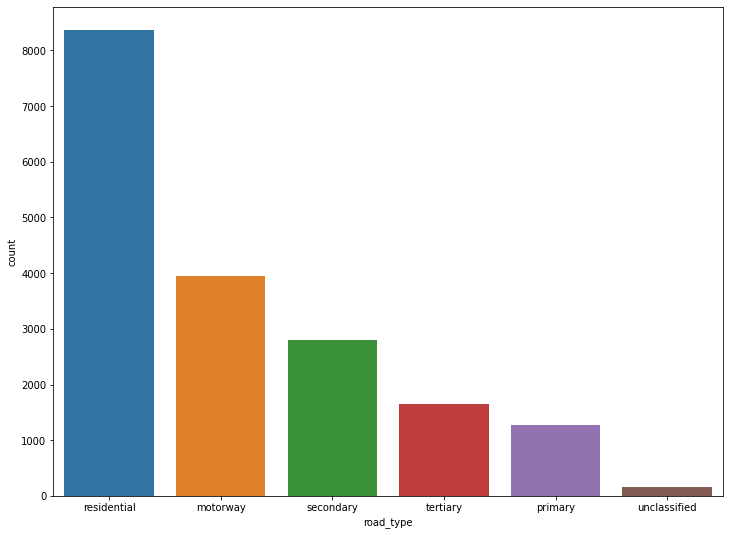

In [266]:
plt.figure(figsize = (12, 9))
sns.countplot(x = 'road_type', 
              data = oakland_vis, 
              order = oakland_vis['road_type'].value_counts().index)

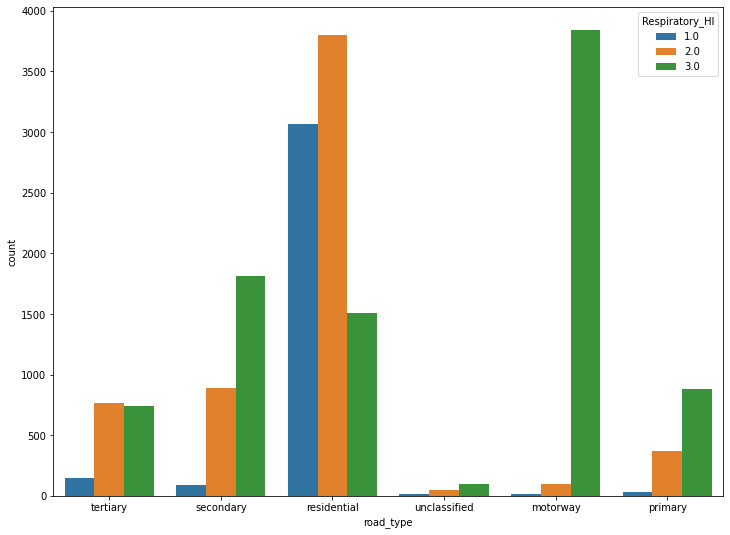

In [267]:
plt.figure(figsize = (12, 9))
sns.countplot(x = 'road_type', 
              hue = oakland_vis['Respiratory_HI'], 
              data = oakland_vis)

### 6.3.1 NO vs Road Type (Boxplot)

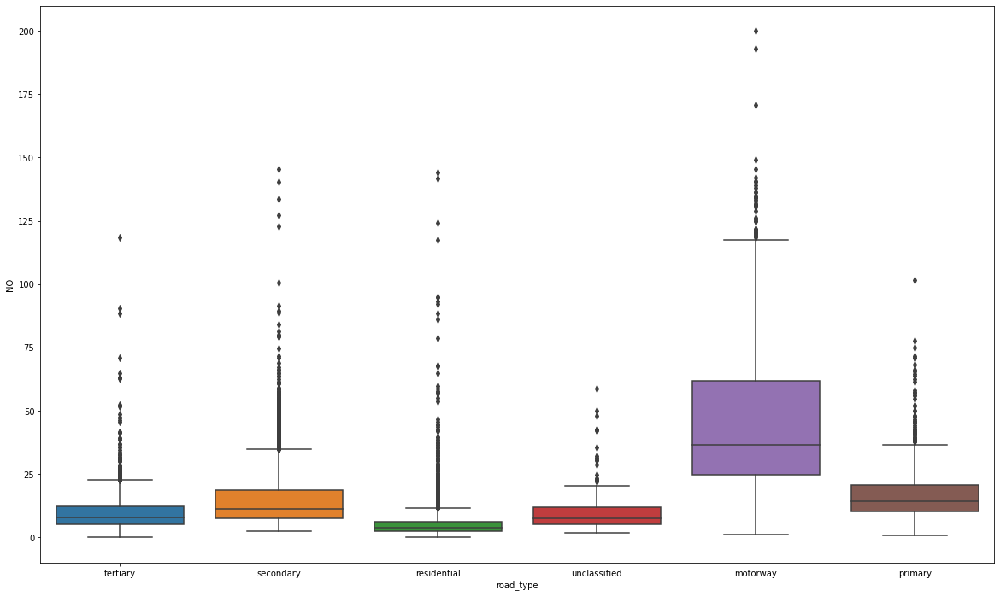

In [268]:
plt.figure(figsize = (20, 12))
sns.boxplot(x = oakland_vis['road_type'], y = oakland_vis['NO'])

### 6.3.2 O$_2$ vs Road Type (Boxplot)

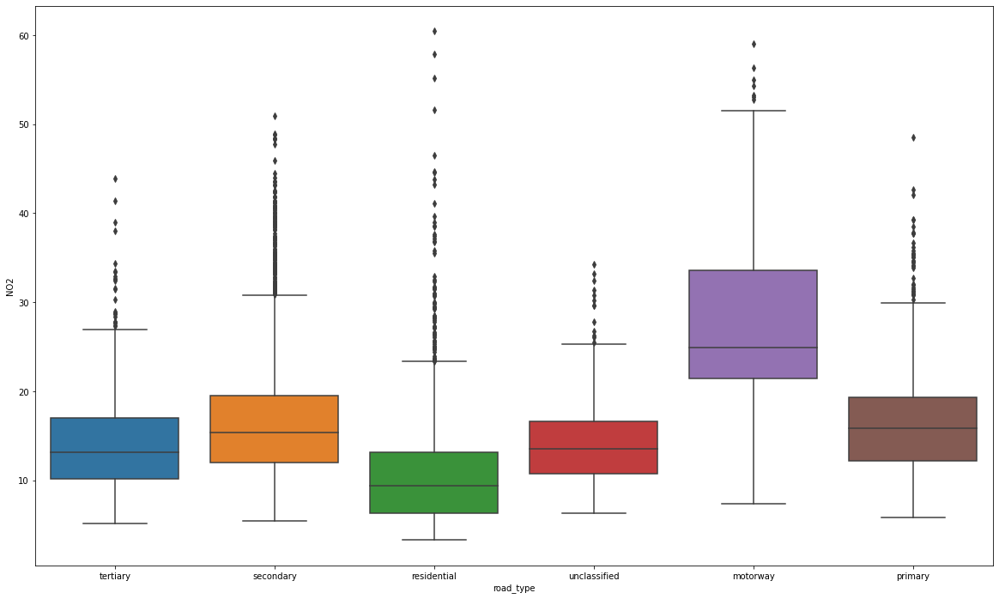

In [269]:
plt.figure(figsize = (20, 12))
sns.boxplot(x = oakland_vis['road_type'], y = oakland_vis['NO2'])

### 6.3.3 PM 2.5 vs Road Type(Boxplot)

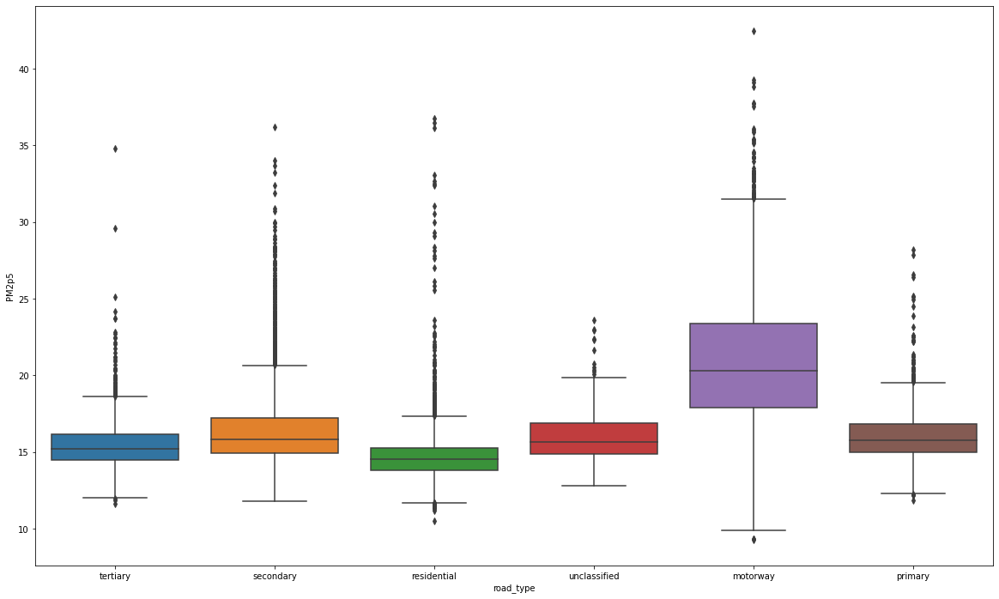

In [270]:
plt.figure(figsize = (20, 12))
sns.boxplot(x = oakland_vis['road_type'], y = oakland_vis['PM2p5'])

## 6.4 Visualization on Zone

### 6.4.0 Size of Data Count and Health Index in Different Road Type 

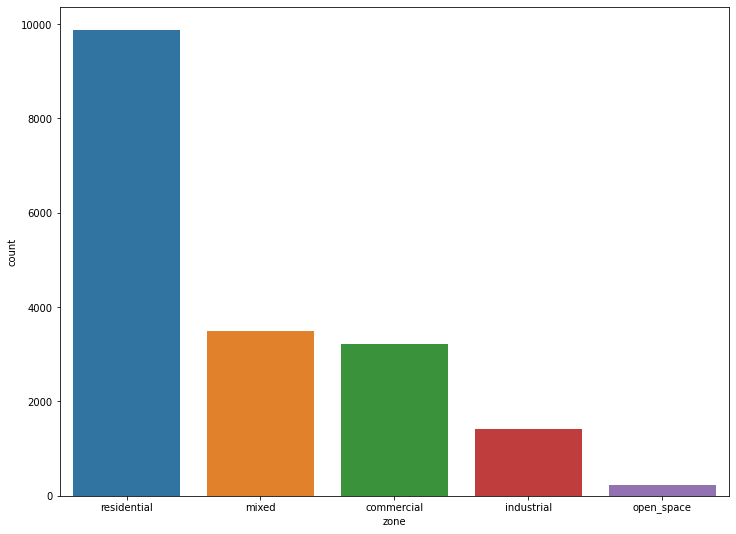

In [271]:
plt.figure(figsize = (12, 9))
sns.countplot(x = 'zone', 
              data = oakland_vis, 
              order = oakland_vis['zone'].value_counts().index)

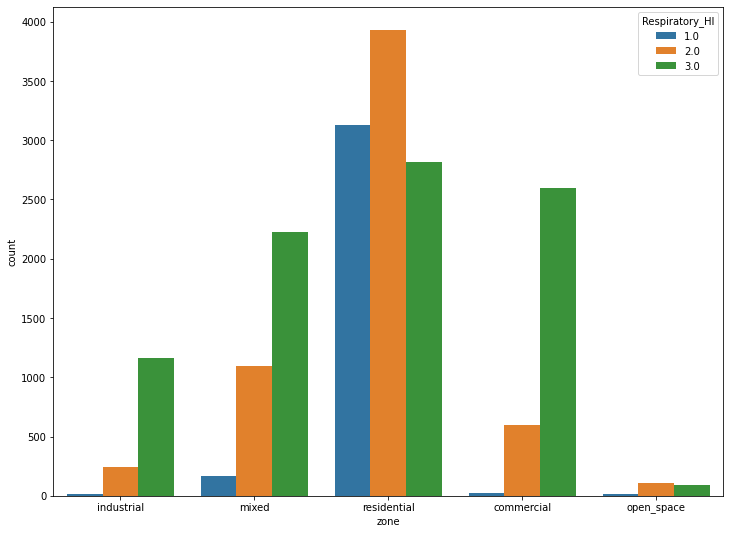

In [272]:
plt.figure(figsize = (12, 9))
sns.countplot(x = 'zone', 
              hue = oakland_vis['Respiratory_HI'], 
              data = oakland_vis)

### 6.4.1 NO vs Zone (Boxplot)

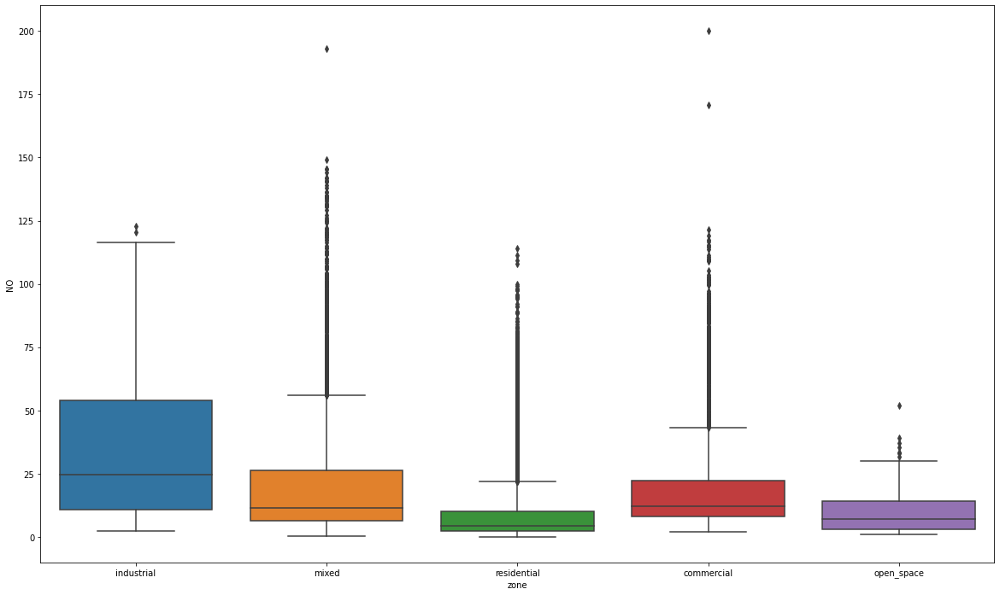

In [273]:
plt.figure(figsize = (20, 12))
sns.boxplot(x = oakland_vis['zone'], y = oakland_vis['NO'])

### 6.4.2 NO$_2$ vs Zone (Boxplot)

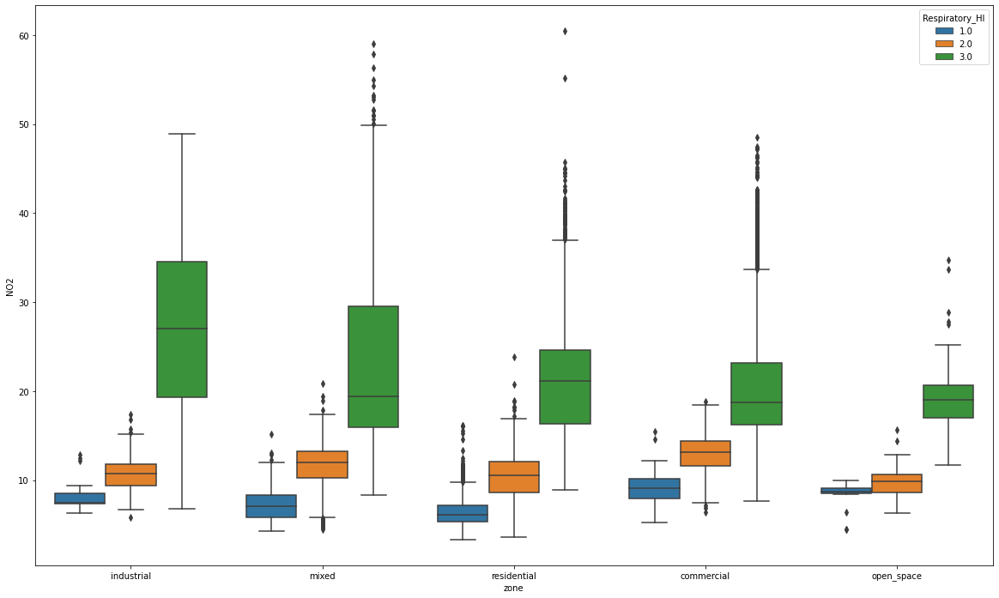

In [274]:
plt.figure(figsize = (20, 12))
sns.boxplot(x = oakland_vis['zone'], 
            y = oakland_vis['NO2'], 
            hue = oakland_vis['Respiratory_HI'])

### 6.4.3 PM 2.5 vs Zone (Boxplot)

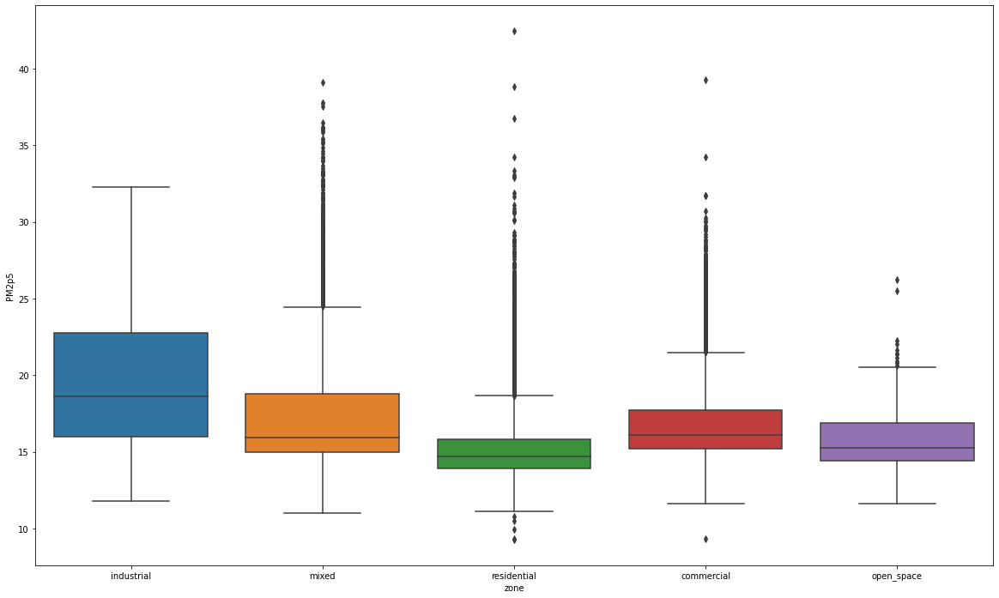

In [275]:
plt.figure(figsize = (20, 12))
sns.boxplot(x = oakland_vis['zone'], y = oakland_vis['PM2p5']);

## 6.5 Visualizatin on Distance to Major Highway



### 6.5.1 NO vs Distance to Major Highway 

Text(0, 0.5, 'NO (ug/m3)')

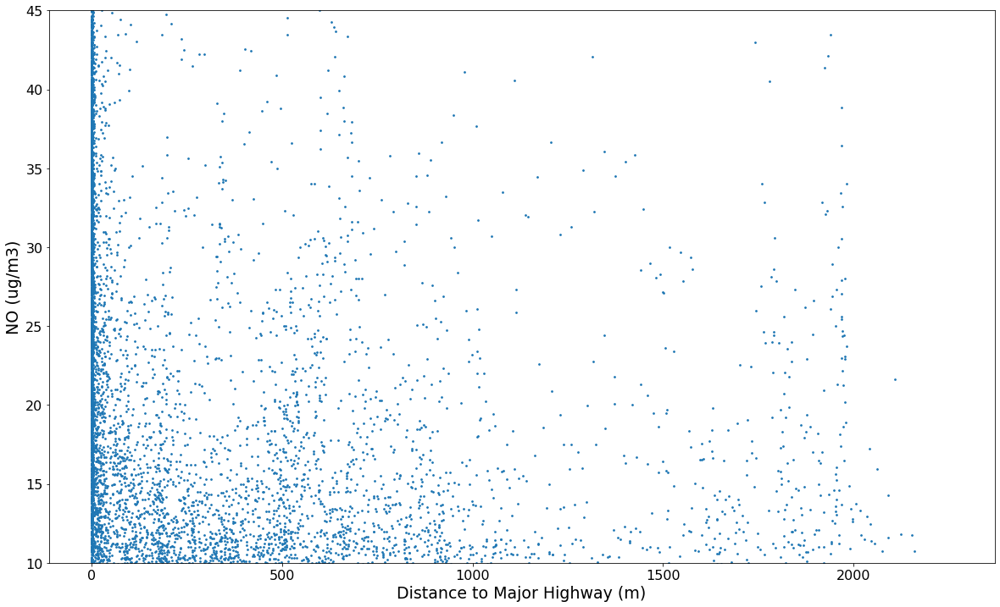

In [276]:
plt.figure(figsize = (20, 12))
plt.scatter(oakland_vis['closest_highway'], oakland_vis['NO'], s = 3)
plt.ylim(10, 45)
plt.tick_params(labelsize = 16)
plt.xlabel('Distance to Major Highway (m)', fontsize = 19)
plt.ylabel('NO (ug/m3)', fontsize = 19)

### 6.5.2 NO$_2$ vs Distance to Major Highway

Text(0, 0.5, 'NO$_2$ (ug/m3)')

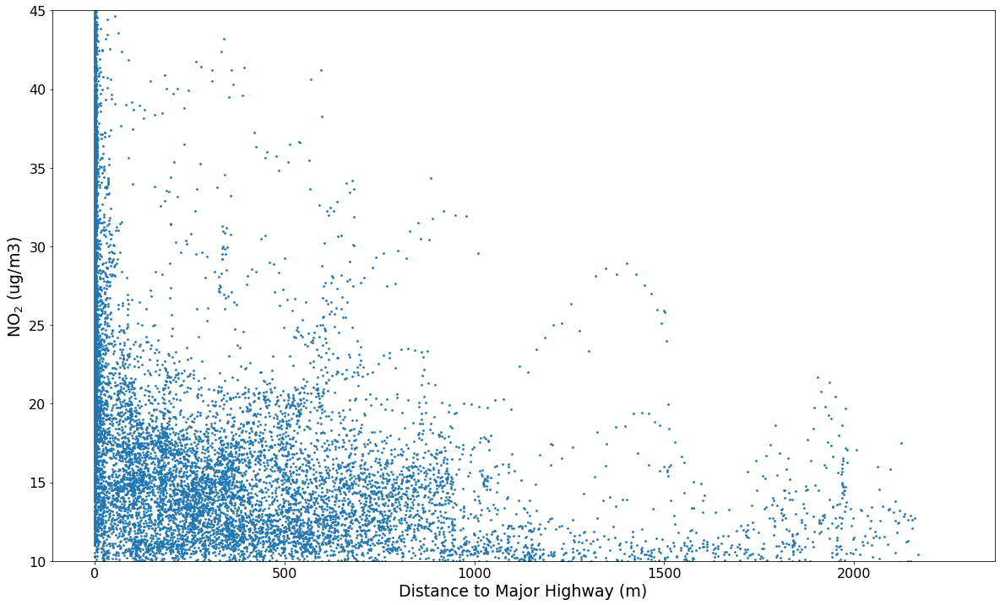

In [277]:
plt.figure(figsize = (20, 12))
plt.scatter(oakland_vis['closest_highway'], oakland_vis['NO2'], s = 3)
plt.ylim(10, 45)
plt.tick_params(labelsize = 16)
plt.xlabel('Distance to Major Highway (m)', fontsize = 19)
plt.ylabel('NO$_2$ (ug/m3)', fontsize = 19)

### 6.5.3 PM 2.5 vs Distance to Major Highway

Text(0, 0.5, 'PM2.5 (ug/m3)')

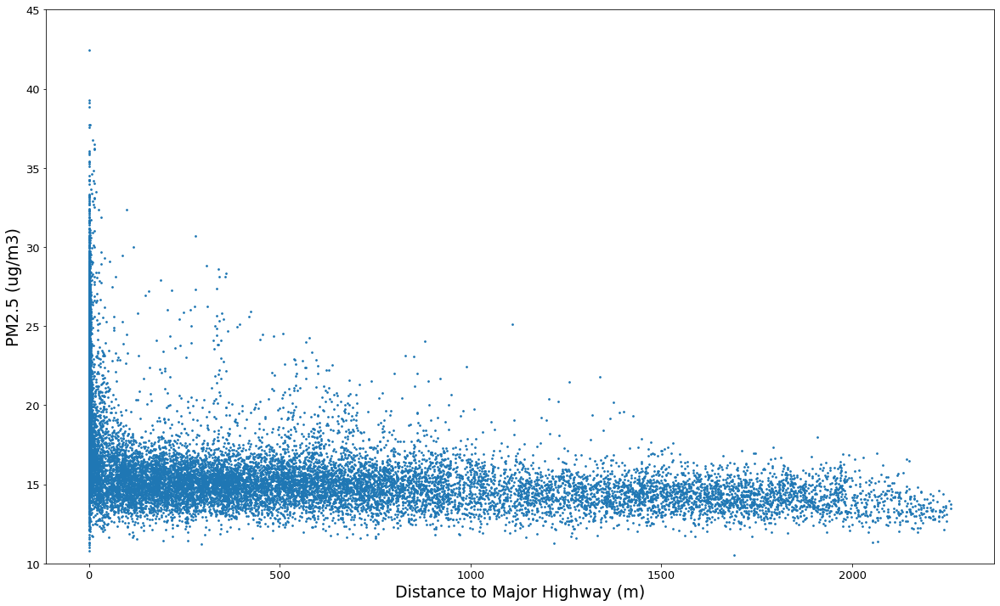

In [278]:
plt.figure(figsize = (20, 12))
plt.scatter(oakland_vis['closest_highway'], oakland_vis['PM2p5'], s = 3)
plt.ylim(10, 45)
plt.tick_params(labelsize = 13)
plt.xlabel('Distance to Major Highway (m)', fontsize = 19)
plt.ylabel('PM2.5 (ug/m3)', fontsize = 19)

# Part 7. Data Splitting

In [279]:
oakland_model = oakland_vis.copy()

In [280]:
print(num_ft)

['NO', 'NO2', 'PM2p5', 'pop_den', 'wind', 'temp', 'closest_highway', 'closest_primary', 'closest_secondary', 'closest_tertiary', 'trafic_signal_dist', 'stop_sign_dist', 'road_type_motorway', 'road_type_primary', 'road_type_residential', 'road_type_secondary', 'road_type_tertiary', 'road_type_unclassified', 'zone_commercial', 'zone_industrial', 'zone_mixed', 'zone_open_space', 'zone_residential', 'Longitude', 'Latitude', 'Respiratory_HI']


In [281]:
X = oakland_model[num_ft].drop(['NO', 'NO2', 'PM2p5', 'road_type_unclassified', 'Longitude', 'Latitude', 'Respiratory_HI'], axis = 1)
X.columns

Index(['pop_den', 'wind', 'temp', 'closest_highway', 'closest_primary',
       'closest_secondary', 'closest_tertiary', 'trafic_signal_dist',
       'stop_sign_dist', 'road_type_motorway', 'road_type_primary',
       'road_type_residential', 'road_type_secondary', 'road_type_tertiary',
       'zone_commercial', 'zone_industrial', 'zone_mixed', 'zone_open_space',
       'zone_residential'],
      dtype='object')

## 7.1 NO

In [282]:
y_NO = oakland_model['NO']
# train = 75%; test = 25%
X_train_NO, X_test_NO, y_train_NO, y_test_NO = model_selection.train_test_split(X, y_NO, test_size = 0.25, random_state = 111)

print('The training data for NO has ' + str(X_train_NO.shape[0]) + ' observation with ' + str(X_train_NO.shape[1]) + ' features.')
print('Thetest data for NO has ' + str(X_test_NO.shape[0]) + ' observation with ' + str(X_test_NO.shape[1]) + ' features.')

The training data for NO has 13664 observation with 19 features.
Thetest data for NO has 4555 observation with 19 features.


In [283]:
# # Feature Scaling 
# scaler = StandardScaler()                              
# scaler.fit(X_train_NO)                                  
# X_train_NO = scaler.transform(X_train_NO)              
# X_test_NO = scaler.transform(X_test_NO)

## 7.2 NO$_2$

In [284]:
y_NO2 = oakland_model['NO2']
# train = 75%; test = 25%
X_train_NO2, X_test_NO2, y_train_NO2, y_test_NO2 = model_selection.train_test_split(X, y_NO2, test_size = 0.25, random_state = 111)

print('The training data for NO2 has ' + str(X_train_NO2.shape[0]) + ' observation with ' + str(X_train_NO2.shape[1]) + ' features.')
print('The test data for NO2 has ' + str(X_test_NO2.shape[0]) + ' observation with ' + str(X_test_NO2.shape[1]) + ' features.')


The training data for NO2 has 13664 observation with 19 features.
The test data for NO2 has 4555 observation with 19 features.


In [285]:
# # Feature Scaling                               
# scaler.fit(X_train_NO2)                                   
# X_train_NO2 = scaler.transform(X_train_NO2)              
# X_test_NO2 = scaler.transform(X_test_NO2)  

## 7.3 PM 2.5

In [286]:
y_PM = oakland_model['PM2p5']
# train = 75%; test = 25% 
X_train_PM, X_test_PM, y_train_PM, y_test_PM = model_selection.train_test_split(X, y_PM, test_size = 0.25, random_state = 111)

print('The training data for PM 2.5 has ' + str(X_train_PM.shape[0]) + ' observation with ' + str(X_train_PM.shape[1]) + ' features.')
print('The test data for PM 2.5 has ' + str(X_test_PM.shape[0]) + ' observation with ' + str(X_test_PM.shape[1]) + ' features.')

The training data for PM 2.5 has 13664 observation with 19 features.
The test data for PM 2.5 has 4555 observation with 19 features.


In [287]:
# # Feature Scaling                       
# scaler.fit(X_train_PM)                            
# X_train_PM = scaler.transform(X_train_PM)            
# X_test_PM = scaler.transform(X_test_PM) 

# Part 8. Modeling

## 8.0 Setup Functions and Parameters

### 8.0.1 Functions for Graphical Correlation Matrix

In [288]:
def abline(slope, intercept):
    """
    Function plots the abline from slope and intercept
    """
    axes = plt.gca()
    x_vals = np.array(axes.get_xlim())
    y_vals = intercept + slope * x_vals
    plt.plot(x_vals, y_vals, '-', color='black')

In [289]:
def pred_summary(pred, ytest, limit = 200):
    """
    Function plots the predictions from the test.

    RMSE and r-squared are selected as measurements.
    """
    sns.scatterplot(pred, ytest)
    abline(1, 0) # Call abline function
    plt.ylim(0, limit)
    plt.xlim(0, limit)
    plt.tick_params(labelsize = 19)
    
    print('RMSE', np.sqrt(mean_squared_error(ytest, pred)))
    print('R2', r2_score(ytest, pred))

In [290]:
def plot_corr(df, size = 10, MI = False):
    """
    Function plots the correlation matrix for each pair of the features in the dataframe.

    Input: df: pandas DataFrame; size: the vertical and horizontal size of the plot.
    """
    if MI == False:
        corr = df.corr()
    else:
        K = df.shape[1]
        corr = np.empty((K, K), dtype = float)
        
        for i, ac in enumerate(X.columns):
            for j, bc in enumerate(X.columns):
                MI = mutual_information(X.loc[:, ac], 
                                        X.loc[:, bc], 
                                        bins = 10, 
                                        normalize = True)
                corr[i, j] = MI
        
    fig, ax = plt.subplots(figsize = (size, size))
    ax.matshow(corr)

    plt.xticks(range(len(corr.columns)), corr.columns)
    plt.yticks(range(len(corr.columns)), corr.columns)

### 8.0.2 Regression Functions and Parameters

In [291]:
forest = RandomForestRegressor(n_jobs = 2)

params_rf = {'max_features': [6, 8, 10], 
          'n_estimators': [150, 200]}

In [292]:
gb_forest = GradientBoostingRegressor()

params_gb = {'max_features': [6, 8, 10],
          'learning_rate': [0.05, 0.1, 0.5],
          'n_estimators': [150, 200]}

## 8.1 NO

### 8.1.1 Ensemble Learning (Bagging)

In [293]:
forest_grid_no = GridSearchCV(forest, params_rf, cv = 5, scoring = 'neg_mean_squared_error')
forest_grid_no.fit(X_train_NO, y_train_NO)

GridSearchCV(cv=5, estimator=RandomForestRegressor(n_jobs=2),
             param_grid={'max_features': [6, 8, 10],
                         'n_estimators': [150, 200]},
             scoring='neg_mean_squared_error')

In [294]:
# Best estimator and CV score
print('Best score (RMSE)', np.sqrt(np.abs(forest_grid_no.best_score_)))
print(forest_grid_no.best_estimator_)

Best score (RMSE) 6.264033556288398
RandomForestRegressor(max_features=8, n_estimators=150, n_jobs=2)


RMSE 6.398472215981999
R2 0.9101721270373756


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


Text(0, 0.5, 'Observed NO')

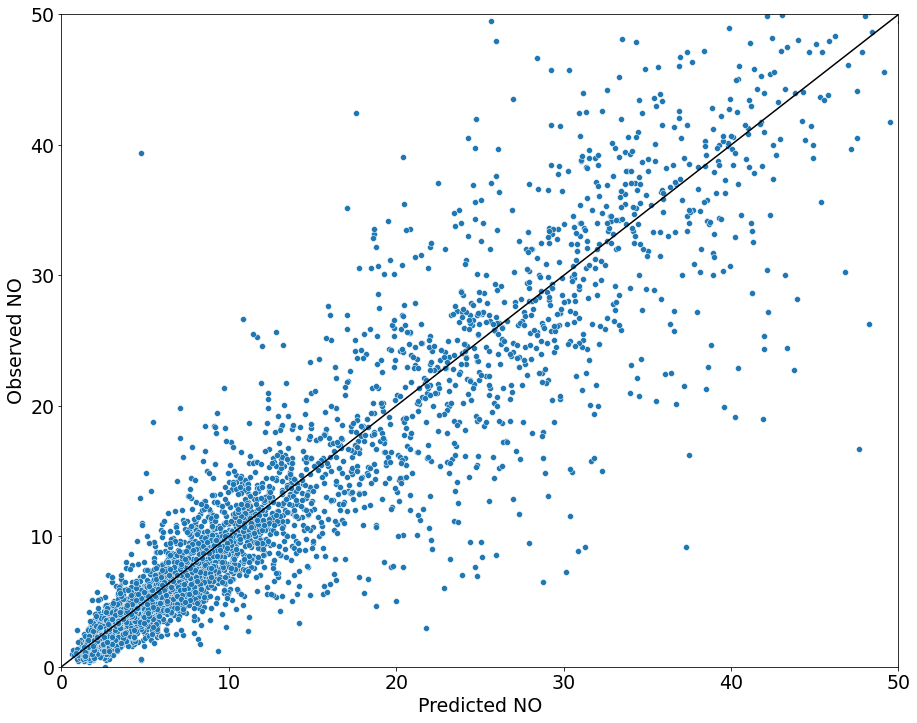

In [295]:
fig = plt.figure(figsize = (15, 12))
forest_out_no = forest_grid_no.predict(X_test_NO)
pred_summary(forest_out_no, y_test_NO, limit = 50)
plt.xlabel('Predicted NO', fontsize = 19)
plt.ylabel('Observed NO', fontsize = 19)

In [296]:
# Feature Importance of NO (RF)
NO_FI_rf = pd.DataFrame(forest_grid_no.best_estimator_.feature_importances_, 
                     index = X_train_NO.columns, 
                     columns = ['Feature Importance of NO (RF)'])
NO_FI_rf = NO_FI_rf.sort_values(by = 'Feature Importance of NO (RF)', ascending = False)
NO_FI_rf

,Feature Importance of NO (RF)
road_type_motorway,0.254820
closest_highway,0.221129
temp,0.089091
wind,0.064856
pop_den,0.062750
road_type_residential,0.059884
closest_primary,0.054454
closest_secondary,0.044699
closest_tertiary,0.042136
stop_sign_dist,0.036985


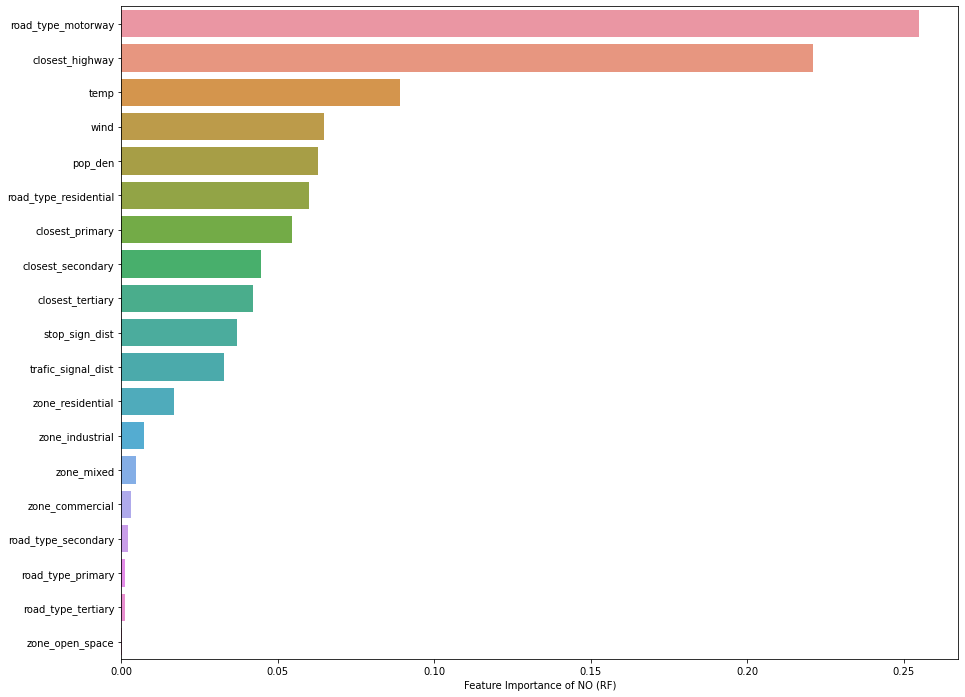

In [297]:
# Plot feature importance of NO (RF)
NO_FI_rf_plt = sns.barplot(x = "Feature Importance of NO (RF)", y = NO_FI_rf.index, data = NO_FI_rf)
NO_FI_rf_plt.figure.set_size_inches(15, 12)

### 8.1.2 Ensemble Learning (Boosting)

In [298]:
gb_forest_grid_no = GridSearchCV(gb_forest, params_gb, cv = 5, scoring = 'neg_mean_squared_error')
gb_forest_grid_no.fit(X_train_NO, y_train_NO)

GridSearchCV(cv=5, estimator=GradientBoostingRegressor(),
             param_grid={'learning_rate': [0.05, 0.1, 0.5],
                         'max_features': [6, 8, 10],
                         'n_estimators': [150, 200]},
             scoring='neg_mean_squared_error')

In [299]:
#Best estimator and CV score
print('Best score (RMSE)', np.sqrt(np.abs(gb_forest_grid_no.best_score_)))
print(gb_forest_grid_no.best_estimator_)

Best score (RMSE) 8.067400743627644
GradientBoostingRegressor(learning_rate=0.5, max_features=10, n_estimators=200)


RMSE 8.224740912979675
R2 0.8515763896187656


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


Text(0, 0.5, 'Observed NO')

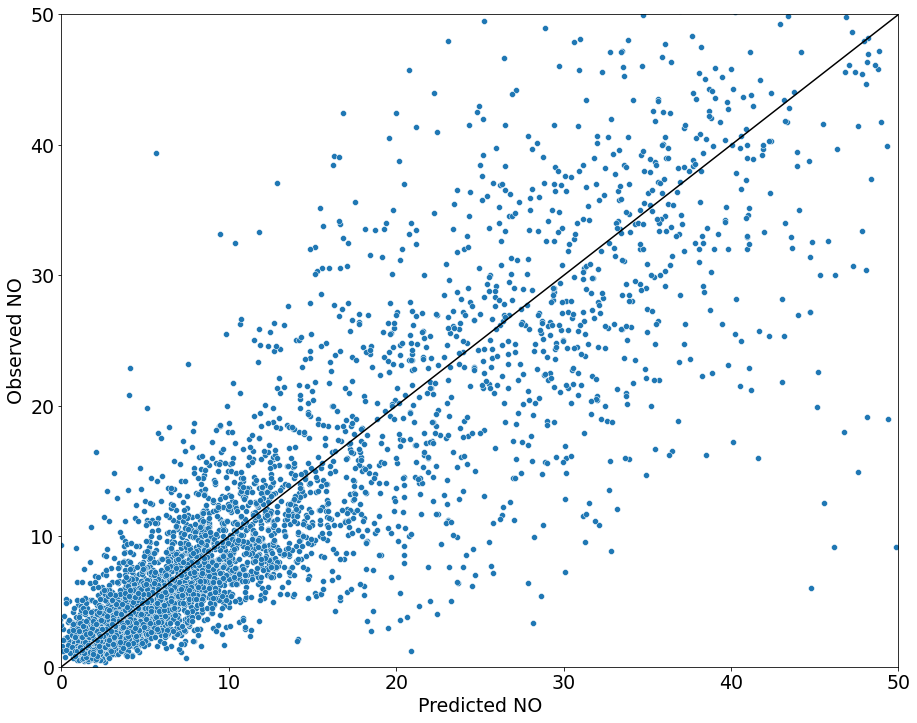

In [300]:
fig = plt.figure(figsize = (15, 12))
gb_forest_out_no = gb_forest_grid_no.predict(X_test_NO)
pred_summary(gb_forest_out_no, y_test_NO, limit = 50)
plt.xlabel('Predicted NO', fontsize = 19)
plt.ylabel('Observed NO', fontsize = 19)

In [301]:
# Feature Importance of NO (GB)
NO_FI_gb = pd.DataFrame(gb_forest_grid_no.best_estimator_.feature_importances_, 
                     index = X_train_NO.columns, 
                     columns = ['Feature Importance of NO (GB)'])
NO_FI_gb = NO_FI_gb.sort_values(by = 'Feature Importance of NO (GB)', ascending = False)
NO_FI_gb

,Feature Importance of NO (GB)
closest_highway,0.429040
road_type_motorway,0.106338
temp,0.097042
road_type_residential,0.081370
wind,0.069446
closest_primary,0.052958
pop_den,0.049969
stop_sign_dist,0.035339
closest_secondary,0.028330
closest_tertiary,0.019709


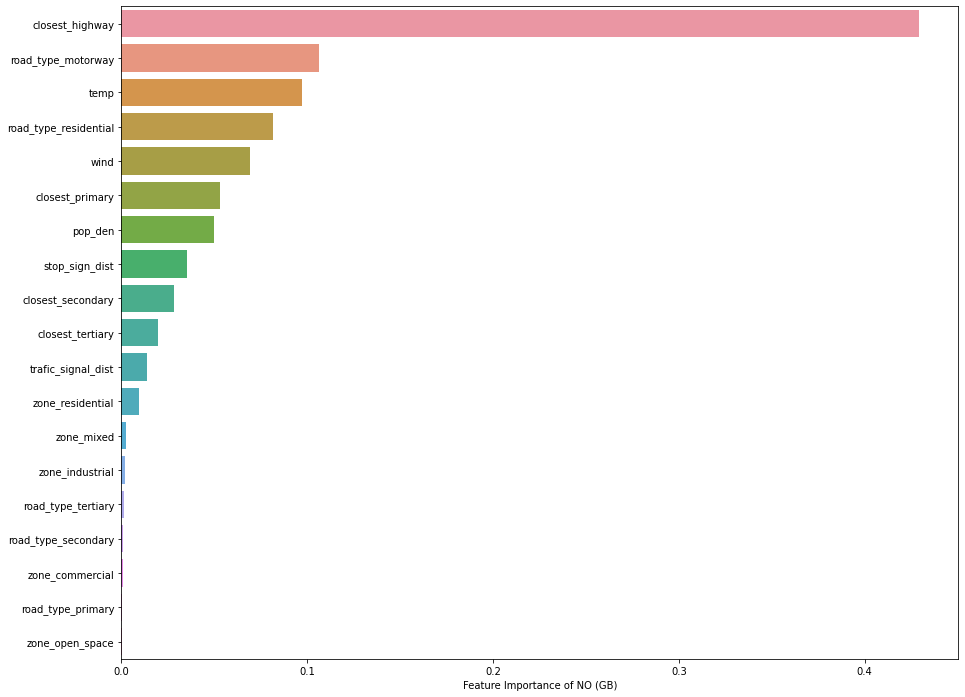

In [302]:
NO_FI_gb_plt = sns.barplot(x = "Feature Importance of NO (GB)", y = NO_FI_gb.index, data = NO_FI_gb)
NO_FI_gb_plt.figure.set_size_inches(15, 12)

### 8.1.3 Permutation Importance

In [303]:
# Print out the best parameters in use in random forest
grid_search_best_no = forest_grid_no.best_estimator_
print('Parameters currently in use:\n')
pprint(grid_search_best_no.get_params())

Parameters currently in use:

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'criterion': 'squared_error',
 'max_depth': None,
 'max_features': 8,
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 150,
 'n_jobs': 2,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}


In [304]:
# Find permutation importance in random forest
NO_pi = permutation_importance(grid_search_best_no, X_test_NO, y_test_NO, n_repeats = 5, random_state = 111)

NO_pi_res = pd.DataFrame(data = np.transpose([NO_pi['importances_mean'], NO_pi['importances_std']]), 
                          index = X_test_NO.columns,
                          columns = ['PI_mean', 'PI_std'])
NO_pi_res = NO_pi_res.sort_values(by = 'PI_mean', ascending = False)
NO_pi_res

,PI_mean,PI_std
closest_highway,0.351681,0.006966
road_type_motorway,0.211263,0.003117
temp,0.126695,0.005794
wind,0.092438,0.002983
pop_den,0.069115,0.000968
closest_primary,0.064962,0.001740
closest_secondary,0.047496,0.002216
road_type_residential,0.042282,0.003427
stop_sign_dist,0.031126,0.001717
closest_tertiary,0.029140,0.001359


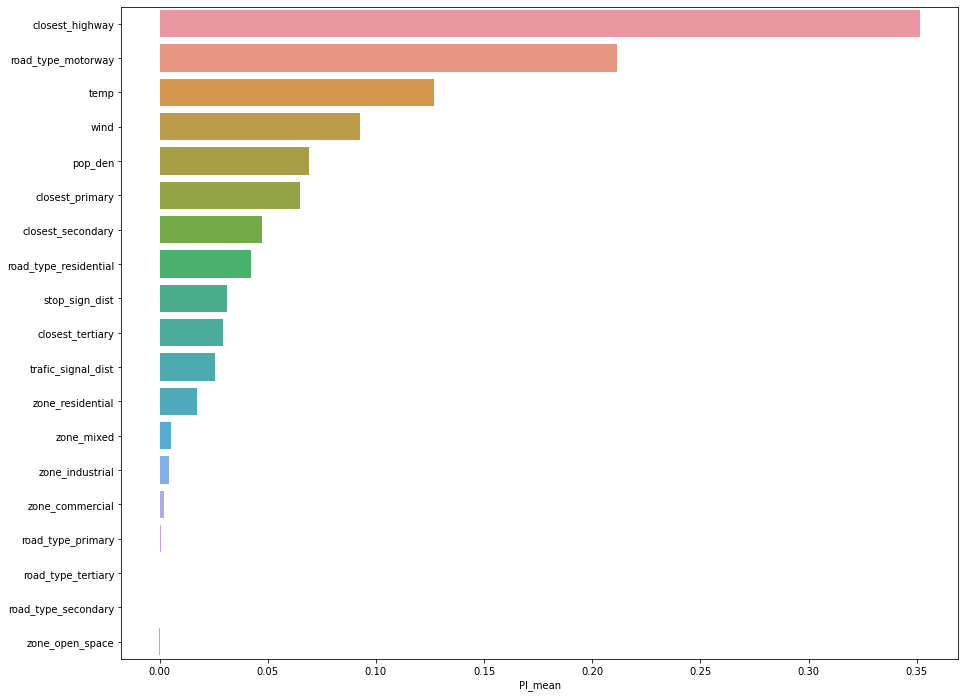

In [305]:
NO_FI_pi_plt = sns.barplot(x = "PI_mean", y = NO_pi_res.index, data = NO_pi_res)
NO_FI_pi_plt.figure.set_size_inches(15, 12)

### 8.1.4 NO Feature Importance Summary

In [306]:
# Print the feature importance summary for NO
summary_NO = pd.DataFrame({'Random Forest': list(NO_FI_rf.index),
                          'Gradient Boost': list(NO_FI_gb.index),
                          'Permutation Importance': list(NO_pi_res.index)})
summary_NO

,Random Forest,Gradient Boost,Permutation Importance
0,road_type_motorway,closest_highway,closest_highway
1,closest_highway,road_type_motorway,road_type_motorway
2,temp,temp,temp
3,wind,road_type_residential,wind
4,pop_den,wind,pop_den
5,road_type_residential,closest_primary,closest_primary
6,closest_primary,pop_den,closest_secondary
7,closest_secondary,stop_sign_dist,road_type_residential
8,closest_tertiary,closest_secondary,stop_sign_dist
9,stop_sign_dist,closest_tertiary,closest_tertiary


## 8.2 NO2

### 8.2.1 Ensemble Learning (Bagging)

In [307]:
forest_grid_no2 = GridSearchCV(forest, params_rf, cv = 5, scoring = 'neg_mean_squared_error')
forest_grid_no2.fit(X_train_NO2, y_train_NO2)

GridSearchCV(cv=5, estimator=RandomForestRegressor(n_jobs=2),
             param_grid={'max_features': [6, 8, 10],
                         'n_estimators': [150, 200]},
             scoring='neg_mean_squared_error')

In [308]:
# Print Grid Search reult
print('Best score (RMSE)', np.sqrt(np.abs(forest_grid_no2.best_score_)))
print(forest_grid_no2.best_estimator_)

Best score (RMSE) 2.2795823874630123
RandomForestRegressor(max_features=10, n_estimators=200, n_jobs=2)


RMSE 2.1773131953635416
R2 0.9439510232885971


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


Text(0, 0.5, 'Observed NO$_2$')

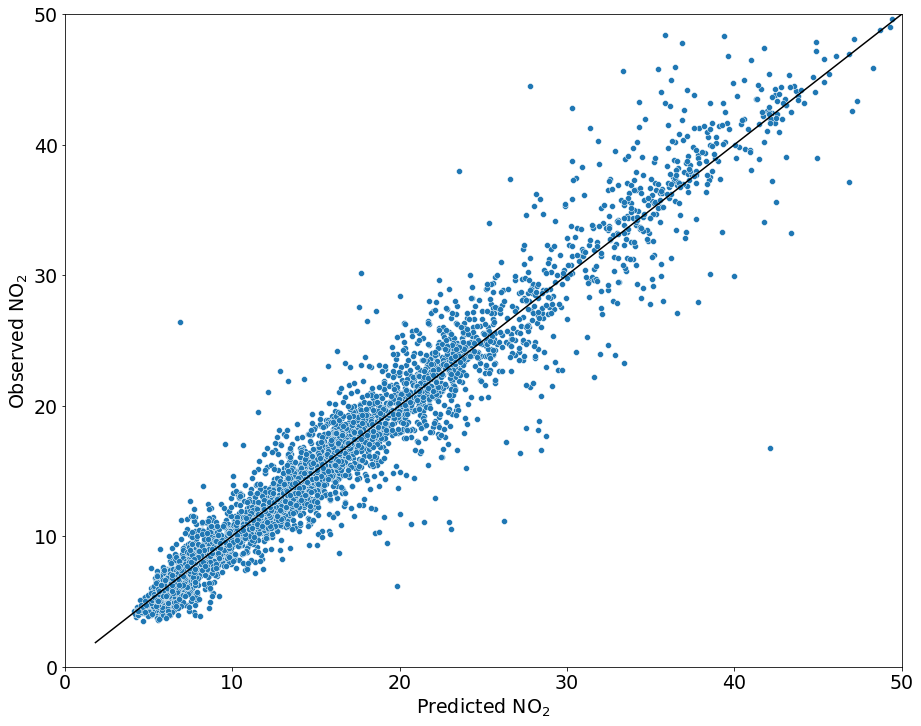

In [309]:
fig = plt.figure(figsize = (15, 12))
forest_out_no2 = forest_grid_no2.predict(X_test_NO2)
pred_summary(forest_out_no2, y_test_NO2, limit = 50)
plt.xlabel('Predicted NO$_2$', fontsize = 19)
plt.ylabel('Observed NO$_2$', fontsize = 19)

In [310]:
# Feature Importance of NO2 (RF)
NO2_FI_rf = pd.DataFrame(forest_grid_no2.best_estimator_.feature_importances_, 
                     index = X_train_NO2.columns, 
                     columns = ['Feature Importance of NO$_2$ (RF)'])
NO2_FI_rf = NO2_FI_rf.sort_values(by = 'Feature Importance of NO$_2$ (RF)', ascending = False)
NO2_FI_rf

,Feature Importance of NO$_2$ (RF)
closest_highway,0.342887
road_type_motorway,0.142952
wind,0.134464
temp,0.064263
road_type_residential,0.052054
pop_den,0.042933
closest_primary,0.041874
stop_sign_dist,0.036148
zone_residential,0.033190
closest_secondary,0.032329


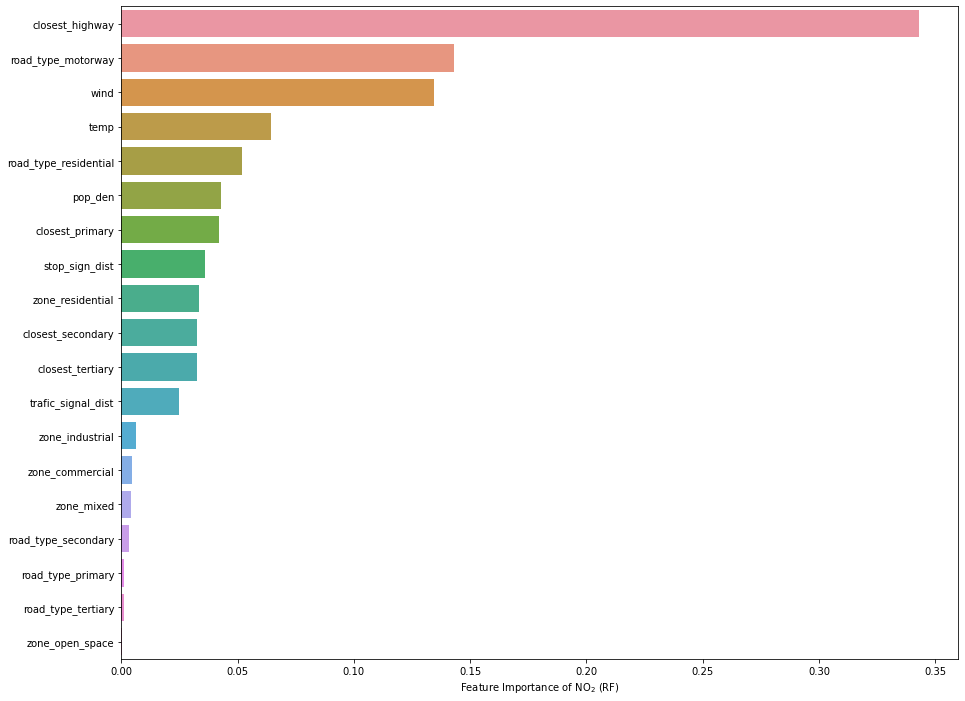

In [311]:
# Plot feature importance of NO2 (RF)
NO2_FI_rf_plt = sns.barplot(x = "Feature Importance of NO$_2$ (RF)", y = NO2_FI_rf.index, data = NO2_FI_rf)
NO2_FI_rf_plt.figure.set_size_inches(15, 12)

### 8.2.2 Ensemble Learning (Boosting)

In [312]:
gb_forest_grid_no2 = GridSearchCV(gb_forest, params_gb, cv = 5, scoring = 'neg_mean_squared_error')
gb_forest_grid_no2.fit(X_train_NO2, y_train_NO2)

GridSearchCV(cv=5, estimator=GradientBoostingRegressor(),
             param_grid={'learning_rate': [0.05, 0.1, 0.5],
                         'max_features': [6, 8, 10],
                         'n_estimators': [150, 200]},
             scoring='neg_mean_squared_error')

In [313]:
# Print Grid Search results
print('Best score (RMSE)', np.sqrt(np.abs(gb_forest_grid_no2.best_score_)))
print(gb_forest_grid_no2.best_estimator_)

Best score (RMSE) 2.964230071284475
GradientBoostingRegressor(learning_rate=0.5, max_features=10, n_estimators=200)


RMSE 2.8482071504561826
R2 0.9040888664741424


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


Text(0, 0.5, 'Observed NO$_2$')

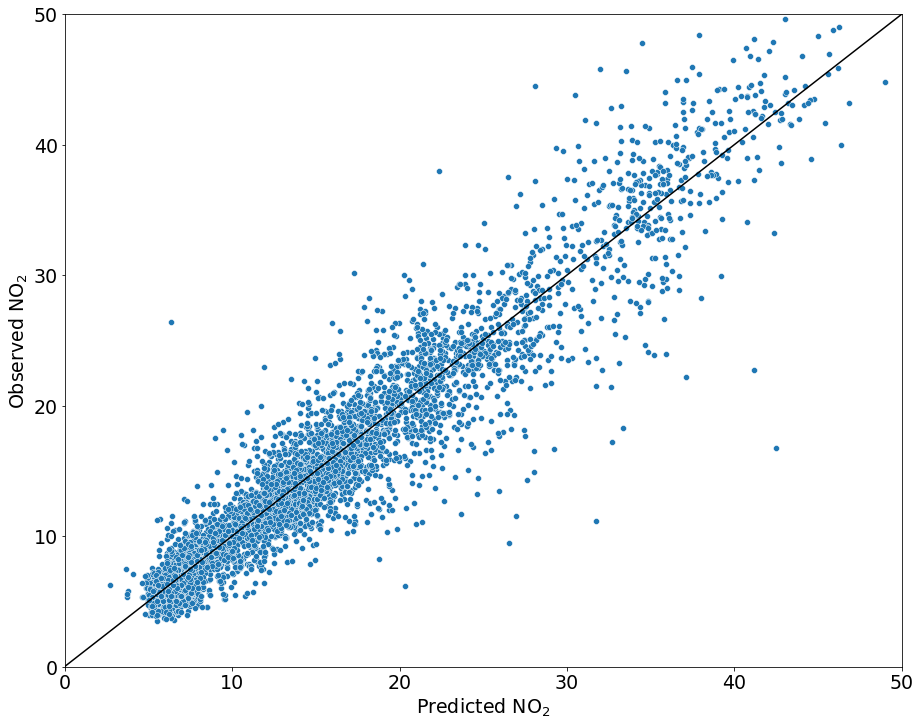

In [314]:
fig = plt.figure(figsize = (15, 12))
gb_forest_out_no2 = gb_forest_grid_no2.predict(X_test_NO2)
pred_summary(gb_forest_out_no2, y_test_NO2, limit = 50)
plt.xlabel('Predicted NO$_2$', fontsize = 19)
plt.ylabel('Observed NO$_2$', fontsize = 19)

In [315]:
# Feature Importance of NO2 (GB)
NO2_FI_gb = pd.DataFrame(gb_forest_grid_no2.best_estimator_.feature_importances_, 
                     index = X_train_NO2.columns, 
                     columns = ['Feature Importance of NO$_2$ (GB)'])
NO2_FI_gb = NO2_FI_gb.sort_values(by = 'Feature Importance of NO$_2$ (GB)', ascending = False)
NO2_FI_gb

,Feature Importance of NO$_2$ (GB)
closest_highway,0.454435
wind,0.112625
road_type_motorway,0.110814
road_type_residential,0.061845
zone_residential,0.054748
pop_den,0.047520
temp,0.038133
closest_primary,0.025045
closest_tertiary,0.022393
closest_secondary,0.020568


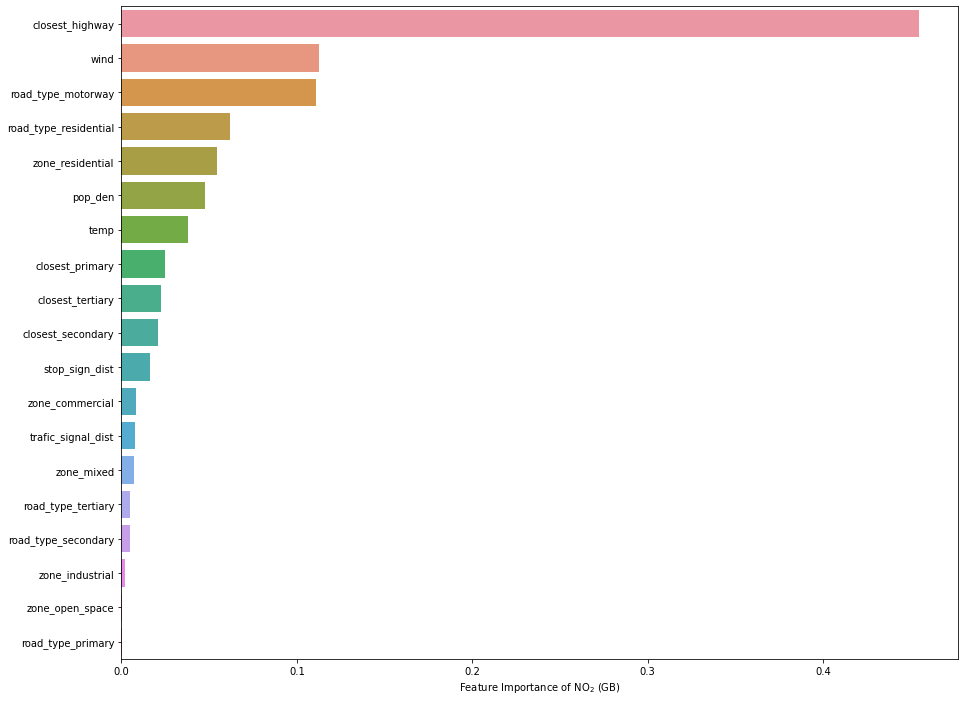

In [316]:
NO2_FI_gb_plt = sns.barplot(x = "Feature Importance of NO$_2$ (GB)", y = NO2_FI_gb.index, data = NO2_FI_gb)
NO2_FI_gb_plt.figure.set_size_inches(15, 12)

### 8.2.3 Permutation Importance

In [317]:
# Print out the best parameters in use in random forest
grid_search_best_no2 = forest_grid_no2.best_estimator_
print('Parameters currently in use:\n')
pprint(grid_search_best_no2.get_params())

Parameters currently in use:

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'criterion': 'squared_error',
 'max_depth': None,
 'max_features': 10,
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 200,
 'n_jobs': 2,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}


In [318]:
# Find permutation importance in random forest
NO2_pi = permutation_importance(grid_search_best_no2, X_test_NO2, y_test_NO2, n_repeats = 5, random_state = 111)

NO2_pi_res = pd.DataFrame(data = np.transpose([NO2_pi['importances_mean'], NO2_pi['importances_std']]), 
                          index = X_test_NO2.columns,
                          columns = ['PI_mean', 'PI_std'])
NO2_pi_res = NO2_pi_res.sort_values(by = 'PI_mean', ascending = False)
NO2_pi_res

,PI_mean,PI_std
closest_highway,0.546820,0.005363
wind,0.262397,0.004149
temp,0.089909,0.002527
road_type_motorway,0.086167,0.001166
closest_primary,0.058473,0.001753
pop_den,0.051364,0.002605
closest_secondary,0.042692,0.002222
stop_sign_dist,0.042604,0.001528
road_type_residential,0.034106,0.000798
closest_tertiary,0.024280,0.001646


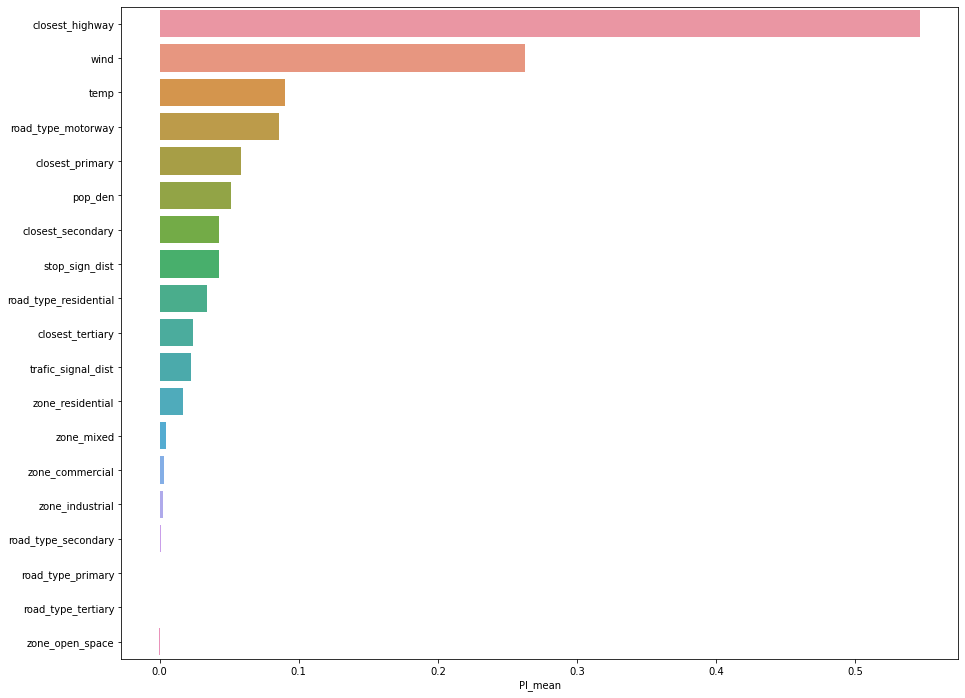

In [319]:
NO2_FI_pi_plt = sns.barplot(x = "PI_mean", y = NO2_pi_res.index, data = NO2_pi_res)
NO2_FI_pi_plt.figure.set_size_inches(15, 12)

### 8.2.4 NO2 Feature Importance Summary

In [320]:
# Print the feature importance summary for NO2
summary_NO2 = pd.DataFrame({'Random Forest': list(NO2_FI_rf.index),
                          'Gradient Boost': list(NO2_FI_gb.index),
                          'Permutation Importance': list(NO2_pi_res.index)})
summary_NO2

,Random Forest,Gradient Boost,Permutation Importance
0,closest_highway,closest_highway,closest_highway
1,road_type_motorway,wind,wind
2,wind,road_type_motorway,temp
3,temp,road_type_residential,road_type_motorway
4,road_type_residential,zone_residential,closest_primary
5,pop_den,pop_den,pop_den
6,closest_primary,temp,closest_secondary
7,stop_sign_dist,closest_primary,stop_sign_dist
8,zone_residential,closest_tertiary,road_type_residential
9,closest_secondary,closest_secondary,closest_tertiary


## 8.3 PM 2.5

### 8.3.1 Ensemble Learning (Bagging)

In [321]:
forest_grid_pm = GridSearchCV(forest, params_rf, cv = 5, scoring = 'neg_mean_squared_error')
forest_grid_pm.fit(X_train_PM, y_train_PM)

GridSearchCV(cv=5, estimator=RandomForestRegressor(n_jobs=2),
             param_grid={'max_features': [6, 8, 10],
                         'n_estimators': [150, 200]},
             scoring='neg_mean_squared_error')

In [322]:
# Print Grid Search results
print('Best score (RMSE)', np.sqrt(np.abs(forest_grid_pm.best_score_)))
print(forest_grid_pm.best_estimator_)

Best score (RMSE) 1.3842685105199073
RandomForestRegressor(max_features=6, n_estimators=200, n_jobs=2)


RMSE 1.4227014440680739
R2 0.8356561489514083


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


Text(0, 0.5, 'Observed PM 2.5')

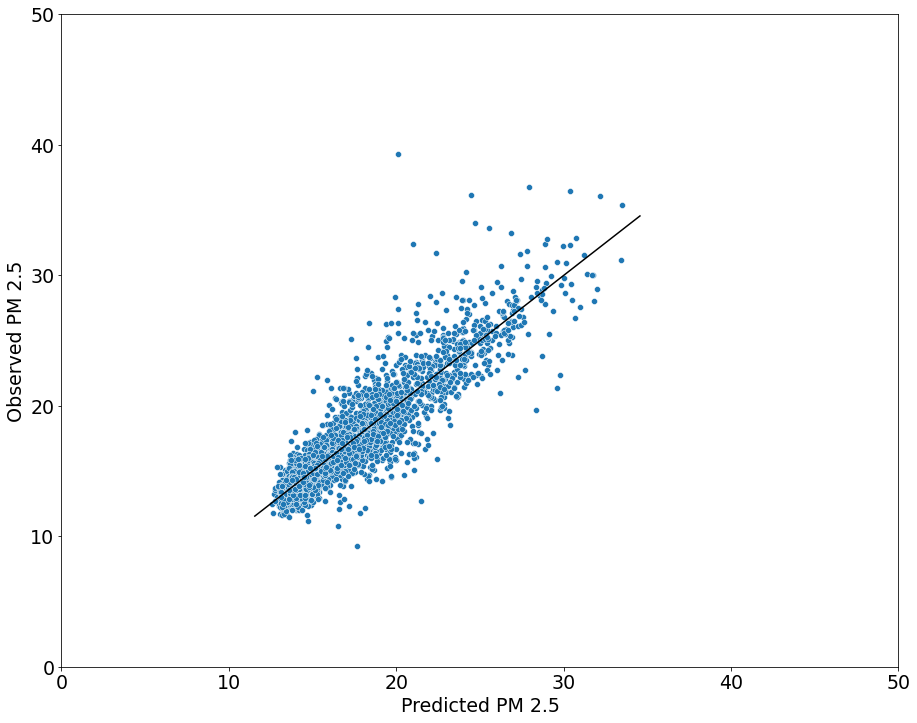

In [323]:
fig = plt.figure(figsize = (15, 12))
forest_out_pm = forest_grid_pm.predict(X_test_PM)
pred_summary(forest_out_pm, y_test_PM, limit = 50)
plt.xlabel('Predicted PM 2.5', fontsize = 19)
plt.ylabel('Observed PM 2.5', fontsize = 19)

In [324]:
# Feature Importance of PM 2.5 (RF)
PM_FI_rf = pd.DataFrame(forest_grid_pm.best_estimator_.feature_importances_, 
                     index = X_train_PM.columns, 
                     columns = ['Feature Importance of PM 2.5 (RF)'])
PM_FI_rf = PM_FI_rf.sort_values(by = 'Feature Importance of PM 2.5 (RF)', ascending = False)
PM_FI_rf

,Feature Importance of PM 2.5 (RF)
closest_highway,0.244125
road_type_motorway,0.183349
wind,0.093509
closest_primary,0.063430
pop_den,0.061951
road_type_residential,0.054507
closest_tertiary,0.052347
temp,0.051777
stop_sign_dist,0.050852
closest_secondary,0.049741


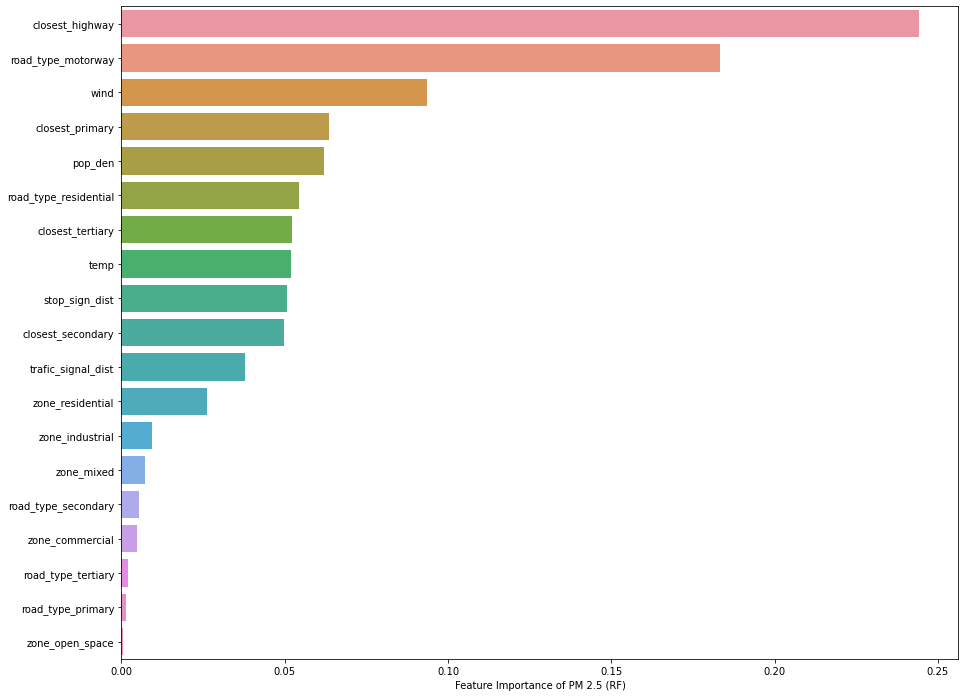

In [325]:
# Plot feature importance of PM 2.5 (RF)
PM_FI_rf_plt = sns.barplot(x = "Feature Importance of PM 2.5 (RF)", y = PM_FI_rf.index, data = PM_FI_rf)
PM_FI_rf_plt.figure.set_size_inches(15, 12)

### 8.3.2 Ensemble Learning (Boosting)

In [326]:
gb_forest_grid_pm = GridSearchCV(gb_forest, params_gb, cv = 5, scoring = 'neg_mean_squared_error')
gb_forest_grid_pm.fit(X_train_PM, y_train_PM)

GridSearchCV(cv=5, estimator=GradientBoostingRegressor(),
             param_grid={'learning_rate': [0.05, 0.1, 0.5],
                         'max_features': [6, 8, 10],
                         'n_estimators': [150, 200]},
             scoring='neg_mean_squared_error')

In [331]:
# Print Grid Search results
print('Best score (RMSE)', np.sqrt(np.abs(gb_forest_grid_pm.best_score_)))
print(gb_forest_grid_pm.best_estimator_)

Best score (RMSE) 1.5848359113173076
GradientBoostingRegressor(learning_rate=0.5, max_features=8, n_estimators=150)


RMSE 1.5955287576828217
R2 0.7933025173400389


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


Text(0, 0.5, 'Observed PM 2.5')

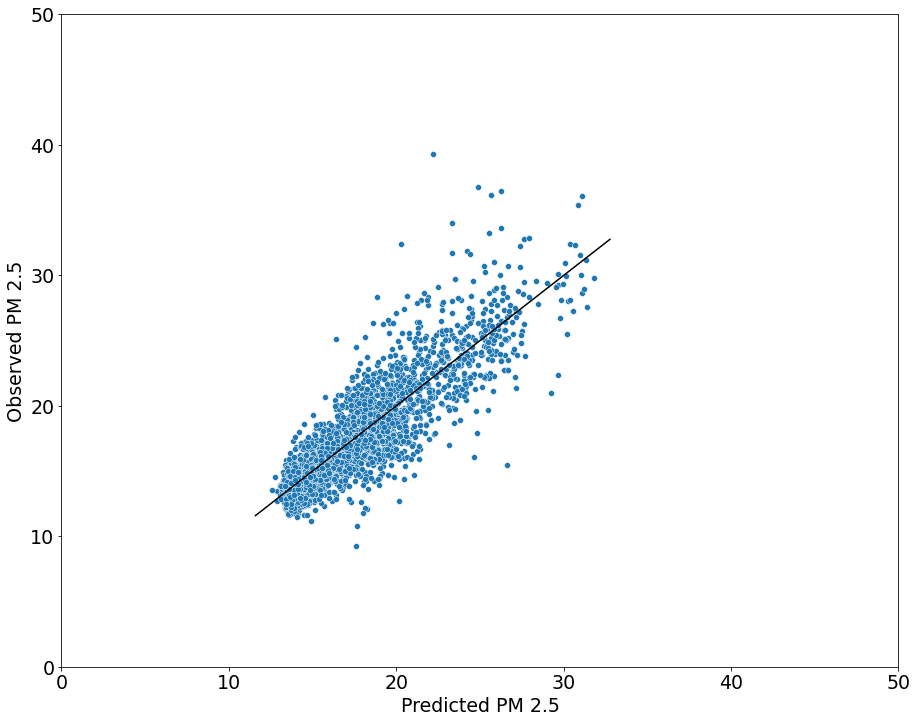

In [332]:
fig = plt.figure(figsize = (15, 12))
gb_forest_out_pm = gb_forest_grid_pm.predict(X_test_PM)
pred_summary(gb_forest_out_pm, y_test_PM, limit = 50)
plt.xlabel('Predicted PM 2.5', fontsize = 19)
plt.ylabel('Observed PM 2.5', fontsize = 19)

In [333]:
# Feature Importance of PM 2.5 (GB)
PM_FI_gb = pd.DataFrame(gb_forest_grid_pm.best_estimator_.feature_importances_, 
                     index = X_train_PM.columns, 
                     columns = ['Feature Importance of PM 2.5 (GB)'])
PM_FI_gb = PM_FI_gb.sort_values(by = 'Feature Importance of PM 2.5 (GB)', ascending = False)
PM_FI_gb

,Feature Importance of PM 2.5 (GB)
road_type_motorway,0.441679
closest_highway,0.126929
wind,0.124218
pop_den,0.105156
closest_secondary,0.042144
temp,0.040813
closest_tertiary,0.028164
closest_primary,0.024414
stop_sign_dist,0.019827
road_type_residential,0.014349


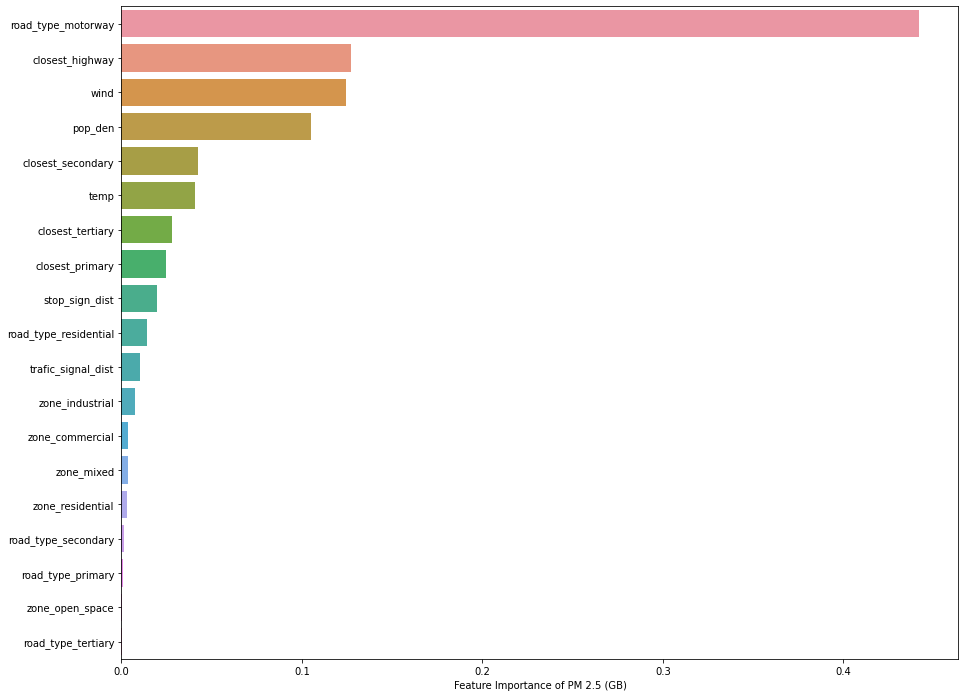

In [334]:
PM_FI_gb_plt = sns.barplot(x = "Feature Importance of PM 2.5 (GB)", y = PM_FI_gb.index, data = PM_FI_gb)
PM_FI_gb_plt.figure.set_size_inches(15, 12)

### 8.3.3 Permutation Importance

In [327]:
# Print out the best parameters in use in random forest
grid_search_best_pm = forest_grid_pm.best_estimator_
print('Parameters currently in use:\n')
pprint(grid_search_best_pm.get_params())

Parameters currently in use:

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'criterion': 'squared_error',
 'max_depth': None,
 'max_features': 6,
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 200,
 'n_jobs': 2,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}


In [328]:
# Find permutation importance in random forest
PM_pi = permutation_importance(grid_search_best_pm, X_test_PM, y_test_PM, n_repeats = 5, random_state = 111)

PM_pi_res = pd.DataFrame(data = np.transpose([PM_pi['importances_mean'], PM_pi['importances_std']]), 
                          index = X_test_PM.columns,
                          columns = ['PI_mean', 'PI_std'])
PM_pi_res = PM_pi_res.sort_values(by = 'PI_mean', ascending = False)
PM_pi_res

,PI_mean,PI_std
closest_highway,0.317363,0.009416
wind,0.162649,0.002969
road_type_motorway,0.111959,0.003269
pop_den,0.054711,0.001147
temp,0.049982,0.003212
closest_primary,0.048669,0.002514
stop_sign_dist,0.031271,0.001572
closest_secondary,0.029842,0.001574
closest_tertiary,0.027293,0.002534
road_type_residential,0.025510,0.002012


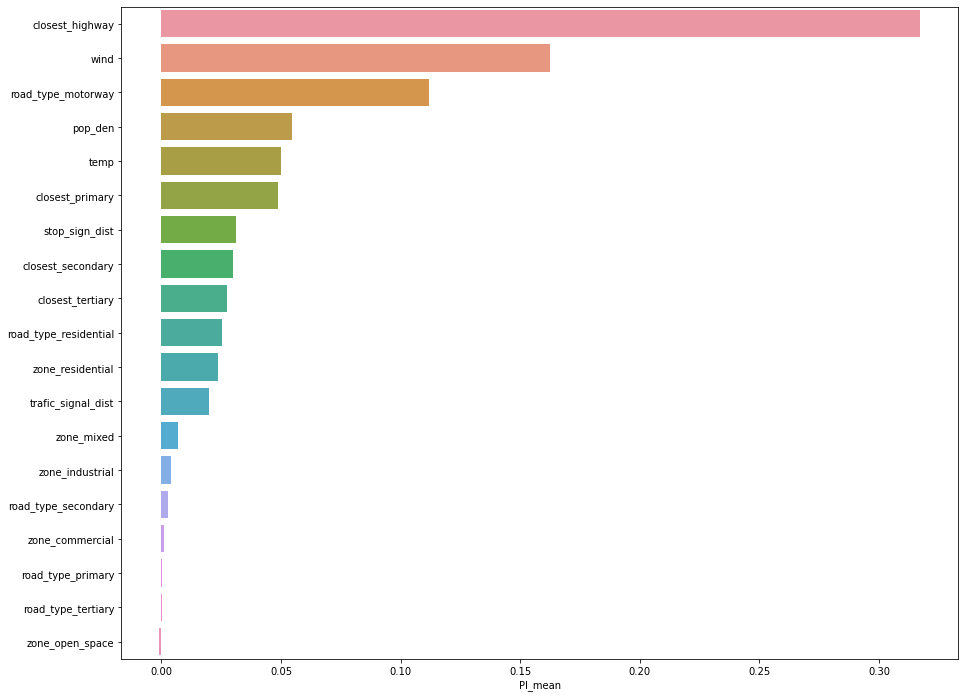

In [329]:
PM_FI_pi_plt = sns.barplot(x = "PI_mean", y = PM_pi_res.index, data = PM_pi_res)
PM_FI_pi_plt.figure.set_size_inches(15, 12)

### 8.3.4 PM 2.5 Feature Importance Summary

In [335]:
# Print the feature importance summary for NO2
summary_PM = pd.DataFrame({'Random Forest': list(PM_FI_rf.index),
                          'Gradient Boost': list(PM_FI_gb.index),
                          'Permutation Importance': list(PM_pi_res.index)})
summary_PM

,Random Forest,Gradient Boost,Permutation Importance
0,closest_highway,road_type_motorway,closest_highway
1,road_type_motorway,closest_highway,wind
2,wind,wind,road_type_motorway
3,closest_primary,pop_den,pop_den
4,pop_den,closest_secondary,temp
5,road_type_residential,temp,closest_primary
6,closest_tertiary,closest_tertiary,stop_sign_dist
7,temp,closest_primary,closest_secondary
8,stop_sign_dist,stop_sign_dist,closest_tertiary
9,closest_secondary,road_type_residential,road_type_residential
